# Python Code Used for Tree Inference

This Jupyter Notebook contains all code for inferring trees of tumor evolution. Note that, in the context of this notebook, subline and single-cell are synonyms and their ids are C1, C2, C3, ..., C24. For C19 and C21, we also use the identifiers C19-original and C21-original to refer to the original sequencing of these sublines, and C19-resequenced and C21-resequenced to refer to the resequencing experiment.

## Input
All inputs are provided in the folder named **input**. They consist of the following:
- The folder **vcf_files**, which contains SNV calls in .vcf format (please check whether the files are archived in .zip format and, if so, unzip them before running this code).
- The file **read_counts.tsv**, which contains read counts in each subline of the detected single nucleotide variants (SNVs). These read counts are primarily used for identifying sites of low coverage or with low variant allele frequencies (VAFs), some of which are removed prior to tree building to retain only the most reliable sites. 

## Output
All outputs are stored in the folder named **output**. Inside this folder, we create two subfolders: **before_input_correction** and **after_input_correction**. Here, we focus on explaining the structure of **before_input_correction**. The structure of **after_input_correction** is analogous.

To find the best tree, we perform a grid search over a large set of (false positive, false negative) noise priors, and for each combination, we create a separate folder inside the **before_input_correction** folder. In each folder, the inferred tree is stored in `.pdf` format (e.g., `tree-fp_0.001-fn_0.075.pdf`), along with the inferred noise-corrected genotype matrix (e.g., `E-fp_0.001-fn_0.075.tsv`). We also store the noisy input genotype matrix (named `D.tsv`), which is used as input for tree building. If you are only interested in the optimal solutions, note that we manually extracted and stored them in the folder **optimal_solutions**.

To identify the best-scoring tree, refer to the tree scores stored in the Excel file `sorted_tree_scores.xlsx`, located inside the **before_input_correction** folder. Trees are sorted in ascending order of their negative log-likelihoods (i.e., the tree corresponding to the false positive and false negative rate combination listed first has the highest likelihood and is selected as the optimal tree). Note that the `sorted_tree_scores.xlsx` files differ between the **before_input_correction** and **after_input_correction** folders.

In addition, inside the **output** folder, we also store two figures — `C17-C19_present-C21_absent.pdf` and `C19-C21_present-C17_absent.pdf` — which show the VAF distributions of selected variants of interest in the C19 doublet analysis.

## Required Packages
To see the packages required to run this notebook, along with the version of Python used, refer to the first 15 lines of the next cell. There, you will find links to the trisicell and schphylo packages, as well as to other more standard and easily installable Python packages.

In [1]:
import sys
print("Python version used to run this notebook is: " + sys.version)
import os
import trisicell as tsc   # see https://github.com/faridrashidi/trisicell
import scphylo            # see https://scphylo-tools.readthedocs.io/en/latest/ 
scphylo.settings.verbosity = 0 
import numpy as np
import pandas as pd
pd.DataFrame.iteritems = pd.DataFrame.items
from collections import OrderedDict
import functools
from datetime import datetime
import ipynbname
import matplotlib.pyplot as plt
import xlsxwriter

parent_output_folder = "./output"
if os.path.exists(parent_output_folder):
    os.system("rm -rf " + parent_output_folder)
os.mkdir(parent_output_folder)


cell_ids = ["C" + str(i) for i in range(1, 25)]

all_sublines_sorted = ['C19', 'C17', 'C23', 'C12', 'C10', 'C14', 'C3', 'C5', 'C2', 'C1', 'C4', 'C22', 'C9', 'C24', 'C21', 'C6',  
                       'C13', 'C18', 'C15', 'C11', 'C16', 'C8', 'C7', 'C20']

sublines_info = pd.DataFrame(index = ['C' + str(i) for i in range(1,25)], columns = ['subline_color'])
for subline_id in ['C23', 'C17', 'C12', 'C10', 'C14', 'C3']:
    sublines_info.at[subline_id, 'subline_color'] = 'green'
for subline_id in ['C2', 'C5']:
    sublines_info.at[subline_id, 'subline_color'] = 'black'
for subline_id in ['C9', 'C24', 'C6', 'C19', 'C21']:
    sublines_info.at[subline_id, 'subline_color'] = 'blue'
for subline_id in ['C1', 'C22', 'C4']:
    sublines_info.at[subline_id, 'subline_color'] = 'orange'
for subline_id in ['C13', 'C15', 'C18', 'C11', 'C16', 'C8', 'C20', 'C7']:
    sublines_info.at[subline_id, 'subline_color'] = 'red'
    



def float_to_string(float_number, num_decimals = 2):
    return ("{:." + str(num_decimals) + "f}").format(float_number)


# Below are some basic functions for working with matrices represented as a dictionary of dictionaries.
# It is similar to pandas dataframe. 

def get_row_ids(D):
	return list(D.keys())


def get_column_ids(D):
	row_ids = get_row_ids(D)
	assert len(row_ids) > 0, "ERROR. Empty dictinoary (zero rows)."
	row_0_id = row_ids[0]
	return list(D[row_0_id].keys())


def get_private_mutations(D, include_absent_in_all_cells = True):
	mut_ids  = get_column_ids(D)
	cell_ids = get_row_ids(D)

	private_muts = []
	for mut_id in mut_ids:
		cells_present = [cell_id for cell_id in cell_ids if D[cell_id][mut_id] == 1]
		if len(cells_present) == 1:
			private_muts.append(mut_id)
		elif len(cells_present) == 0 and include_absent_in_all_cells == True:
			private_muts.append(mut_id)
	
	return private_muts


def get_clonal_mutations(D):
	mut_ids  = get_column_ids(D)
	cell_ids = get_row_ids(D)
    
	clonal_muts = []
	for mut_id in mut_ids:
		cells_present = [cell_id for cell_id in cell_ids if D[cell_id][mut_id] == 1]
		if len(cells_present) == len(cell_ids):
			clonal_muts.append(mut_id)
	
	return clonal_muts


# clade is array containing set of sublines, e.g., ['C1', 'C4']
# genotype_matrix is usually D or E
# exact_match - if set to False, then any mutation present in all cells of the clade will be added
# exact_match - if set to True (default) then mutations present exactly in all cells of the clade (and nowhere else) are reported
def get_mutations_specific_to_clade(genotype_matrix, clade, exact_match=True):
	mut_ids  = get_column_ids(genotype_matrix)
	cell_ids = get_row_ids(genotype_matrix)
    
	clade_specific_muts = []
	for mut_id in mut_ids:
		cells_present = [cell_id for cell_id in cell_ids if genotype_matrix[cell_id][mut_id] == 1]
        
		if exact_match == True and set(cells_present) == set(clade):
			clade_specific_muts.append(mut_id)
            
		elif exact_match == False and set(cells_present).issubset(set(clade)):
			clade_specific_muts.append(mut_id)
            
	return clade_specific_muts
    

def delete_columns_of_matrix(A, columns_to_delete):
	row_ids = get_row_ids(A)
	for col_id in columns_to_delete:
		for row_id in row_ids:
			del A[row_id][col_id]


def delete_rows_of_matrix(A, rows_to_delete):
	for row_id in rows_to_delete:
		del A[row_id]


def remove_private_mutations(D):
    private_muts = get_private_mutations(D)
    delete_columns_of_matrix(D, private_muts)


def remove_clonal_mutations(D):
    clonal_muts = get_clonal_mutations(D)
    delete_columns_of_matrix(D, clonal_muts)


def read_matrix(path_matrix_file, entries_type="str", separator="\t"):
	input_file = open(path_matrix_file, "r")
	input_lines = input_file.readlines()
	input_file.close()
	assert len(input_lines) > 0, "ERROR. Input file " + path_matrix_file + " is empty."

	header_entries	= input_lines[0].rstrip("\n").split(separator)
	column_ids = header_entries[1:len(header_entries)]
	num_columns = len(column_ids)
	assert len(set(column_ids)) == len(column_ids), "ERROR. Column ids in file " + path_matrix_file + " are not unique."
	assert num_columns != 0, "ERROR. Number of columns in " + path_matrix_file + " equals zero."

	D = OrderedDict()
	for line in input_lines[1:len(input_lines)]:
		line_columns = line.rstrip("\n").split(separator)
		row_id = line_columns[0].strip()
		assert row_id not in D.keys(), "ERROR. Repeating row id " + rowID
		D[row_id] = OrderedDict()
		for i in range(num_columns):
			D[row_id][column_ids[i]] = line_columns[1+i]
			if entries_type == "int":
				D[row_id][column_ids[i]] = int(D[row_id][column_ids[i]])
			elif entries_type == "float":
				D[row_id][column_ids[i]] = float(D[row_id][column_ids[i]])
			else:
				assert entries_type == "str", "ERROR. Unknown entries type " + str(entries_type) 
	return D


def write_matrix_to_file(D, path_output_file, upper_left_corner = "cell_id_x_mut_id", separator = "\t"):
    output_file = open(path_output_file, "w")
    
    row_ids = get_row_ids(D)
    column_ids = get_column_ids(D)
    
    output_file.write(separator.join([upper_left_corner] + column_ids) + "\n")
    for row_id in row_ids:
        output_file.write(separator.join([row_id] + [str(D[row_id][col_id]) for col_id in column_ids]) + "\n")
        
    output_file.close()


def dataframe_to_matrix(df):
	A = {}
	for row_id in df.index:
		A[row_id] = {}
		for col_id in df.columns:
			A[row_id][col_id] = df.at[row_id, col_id]  
	return A


# Below is a function for computing the log-likelihood of a given noise-corrected genotype matrix E,  
# given the observed genotype matrix D and the rates of false positive (alpha) and false negative (beta).  

def calculate_log_likelihood(D, E, alpha, beta, include_NA = True):
	assert set(get_column_ids(D)) == set(get_column_ids(E)), "ERROR. Different sets of mutations between matrices D and E."
	assert set(get_row_ids(D)) == set(get_row_ids(E)), "ERROR. Different sets of cells between the matrices D and E."

	score = 0.0
	for cell_id in get_row_ids(D):
		for mut_id in get_column_ids(D):
			if D[cell_id][mut_id] == 0 and E[cell_id][mut_id] == 1:
				score += np.log(beta)
			elif D[cell_id][mut_id] == 1 and E[cell_id][mut_id] == 1:
				score += np.log(1-beta)
			elif D[cell_id][mut_id] == 1 and E[cell_id][mut_id] == 0:
				score += np.log(alpha)
			elif D[cell_id][mut_id] == 0 and E[cell_id][mut_id] == 0:
				score += np.log(1-alpha)
			elif D[cell_id][mut_id] == 3 and include_NA == True: # does not impact the best tree selection
				score += np.log(0.50)
	
	return score


# sort a given dictionary by values (in ascending order) 
def get_sorted_by_values_dictionary(v): 
    keys   = list(v.keys()) 
    values = list(v.values()) 
    
    sorted_value_index = np.argsort(values)
    sorted_dict = OrderedDict() 
    for i in sorted_value_index: 
        sorted_dict[keys[i]] = values[i] 
    return sorted_dict 



# returns negative value if mut1 comes before mut2
# We assume that mutation ids are provided as inputs and that they are of the form 3-22344-... (that is chrom-pos-...)
def compare_positions(mut_1, mut_2):
	chr1, pos1 = mut_1.split("-")[0], mut_1.split("-")[1]
	chr2, pos2 = mut_2.split("-")[0], mut_2.split("-")[1]
    
	output = None
    
	if chr1 == 'Y' and chr2 == 'Y':
		output = int(pos1) < int(pos2)
	
	elif chr1 == 'Y' and chr2 != 'Y':
		output = False
    
	elif chr2 == 'Y' and chr1 != 'Y':
		output = True
    
	elif chr1 == 'X' and chr2 == 'Y':
		output = True
    
	elif chr1 == 'X' and chr2 == 'X':
		output = int(pos1) < int(pos2)
    
	elif chr1 == 'X' and chr2 not in ['X', 'Y']:
		output = False
    
	elif chr2 == 'X' and chr1 not in ['X', 'Y']:
		output = True 
    
	elif int(chr1) < int(chr2):
		output = True
	
	elif int(chr1) > int(chr2):
		output = False

	elif int(chr1) == int(chr2):
		output = int(pos1) < int(pos2)
	
	assert output is not None, "ERROR. Unknown case encountered for " + mut_1 + " and " + mut_2
    
	if output == True: # if first mutation should come before the second return -1
		return -1
	else:
		return 1


# Mutation ids passed as arguments should be in the form 1-49193810-C-T
def distance_between_mutations(mut1, mut2):
    chr1  = mut1.split("-")[0]
    pos1  = int(mut1.split("-")[1])
    chr2  = mut2.split("-")[0]
    pos2  = int(mut2.split("-")[1])
    
    if chr1 != chr2:
        return 7*10**10  # return some large number if on diff. chromosomes
    else:
        return abs(pos2 - pos1)


def get_close_mutations(mut_ids, cutoff=100):
    mut_ids.sort(key=functools.cmp_to_key(compare_positions))
    num_muts = len(mut_ids)
    close_muts = []

    if num_muts <= 1:
        return close_muts
        
    for j in range(num_muts):
        if j == 0 or j==num_muts-1: # edge case
            continue
                    
        else:
            if distance_between_mutations(mut_ids[j], mut_ids[j-1]) < cutoff or distance_between_mutations(mut_ids[j], mut_ids[j+1]) < cutoff:
                close_muts.append(mut_ids[j])
                        
    return close_muts

    
def infer_tree(D, output_folder):
    if os.path.exists(output_folder):
        os.system("rm -rf " + output_folder)
    os.mkdir(output_folder)
    
    df_input = pd.DataFrame(D).transpose()
    NLL = {}

    for alpha in [0.01, 0.001, 0.0001, 0.00001, 0.000001]:    
        for beta in [0.05, 0.075, 0.10, 0.125, 0.15, 0.175, 0.20]:
            print("\nFalse positive rate = " + str(alpha))
            print("False negative rate = " + str(beta) + "\n")

            conflict_free_matrix = scphylo.tl.scistree(df_input, alpha, beta, experiment=False)
            E = dataframe_to_matrix(conflict_free_matrix)
            NLL[str(alpha) + "_" + str(beta)] = -(calculate_log_likelihood(D, E, alpha, beta))

            print("\nNegative Log Likehood of the Inferred Tree: " + str(NLL[str(alpha) + "_" + str(beta)]))

            
            current_output_folder = os.path.join(output_folder, "fp_" + str(alpha) + "-fn_" + str(beta))
            os.mkdir(current_output_folder)

            write_matrix_to_file(D, os.path.join(current_output_folder, "D" ".tsv"))
            write_matrix_to_file(E, os.path.join(current_output_folder, "E" + "-fp_" + str(alpha) + "-fn_" + str(beta) + ".tsv"))
            
            tree = tsc.ul.to_tree(conflict_free_matrix)
            tsc.pl.dendro_tree(tree, cell_info = sublines_info, label_color = 'subline_color',
                      width = 2400, height = 1200, dpi = 300,
                              output_file = os.path.join(current_output_folder, "tree-" + "fp_" + str(alpha) + "-fn_"  + str(beta) + ".pdf")
                              )

            print("-----------------------------------------------------------------------------------")

    
    solution_info_excel_file = xlsxwriter.Workbook(os.path.join(output_folder, "sorted_tree_scores.xlsx"))
    worksheet = solution_info_excel_file.add_worksheet("Tree Scores")

    row, column = 0, 0
    for column_name in ['False positive rate', 'False negative rate', 'Negative Log Likelihood']:
        worksheet.write(row, column, column_name)
        column += 1
    
    NLL_sorted = get_sorted_by_values_dictionary(NLL)
    for alpha_beta in list(NLL_sorted.keys()):
        alpha = float(alpha_beta.split("_")[0])
        beta  = float(alpha_beta.split("_")[1])
        row += 1
        column = 0
        for value in [alpha, beta, NLL_sorted[alpha_beta]]:
            worksheet.write(row, column, value)
            column += 1
        
    solution_info_excel_file.close()

    best_alpha_beta = list(NLL_sorted.keys())[0]
    best_fp = float(best_alpha_beta.split("_")[0])
    best_fn = float(best_alpha_beta.split("_")[1])
    best_tree_folder = os.path.join(output_folder, "fp_" + str(best_fp) + "-fn_" + str(best_fn))
    print("\nTree inference has been completed successfully. For the best tree, check the folder " + best_tree_folder + "\n") 

Python version used to run this notebook is: 3.10.16 (main, Dec 11 2024, 10:22:29) [Clang 14.0.6 ]


In [2]:
mutations_folder = "./input/vcf_files"
D = {}

for cell_id in ["C" + str(i) for i in range(1,25)]:    
    print("Processing variants detected in subline " + cell_id)
    
    D[cell_id] = {}
    mutations_file = open(os.path.join(mutations_folder, "B2905_" + cell_id + ".vcf"), "r")
    
    column_names = ["CHROM",  "POS", "ID", "REF", "ALT", "QUAL", "FILTER", "INFO", "FORMAT", cell_id]
    
    for line in mutations_file:
        if line.startswith("#"):
            continue

        line_columns = dict(zip(column_names, line.strip().split()))

        chrom = line_columns["CHROM"]
        if chrom not in ["chr" + str(i) for i in range(1,20)]:
            continue

        chrom = line_columns["CHROM"][3:]       
        pos   = int(line_columns["POS"])
        ref   = line_columns["REF"]
        alt   = line_columns["ALT"]
        
        if ref not in ["A", "C", "G", "T"] or alt not in ["A", "C", "G", "T"]:
            continue
        
        mut_id = "-".join([chrom, str(pos), ref, alt])        
           
        format_entries = dict(zip(line_columns["FORMAT"].split(":"), line_columns[cell_id].split(":")))
        
        if "1" in format_entries["GT"]:     
            D[cell_id][mut_id] = 1
        else:
            D[cell_id][mut_id] = 0

Processing variants detected in subline C1
Processing variants detected in subline C2
Processing variants detected in subline C3
Processing variants detected in subline C4
Processing variants detected in subline C5
Processing variants detected in subline C6
Processing variants detected in subline C7
Processing variants detected in subline C8
Processing variants detected in subline C9
Processing variants detected in subline C10
Processing variants detected in subline C11
Processing variants detected in subline C12
Processing variants detected in subline C13
Processing variants detected in subline C14
Processing variants detected in subline C15
Processing variants detected in subline C16
Processing variants detected in subline C17
Processing variants detected in subline C18
Processing variants detected in subline C19
Processing variants detected in subline C20
Processing variants detected in subline C21
Processing variants detected in subline C22
Processing variants detected in subline C

In [3]:
# Filtering out private and clonal mutations as they are not informative for phylogenetic analysis
remove_private_mutations(D) 
remove_clonal_mutations(D)

# Filtering out mutations that have another mutation within 100 bp, as these are typically unreliable due to misalignment artifacts.
close_muts = get_close_mutations(get_column_ids(D), cutoff=100)
delete_columns_of_matrix(D, close_muts)

In [4]:
# Obtaining raw read counts for the remaining mutations

extracted_read_counts = read_matrix("input/read_counts.tsv")
read_counts = {}

for row_id in get_row_ids(extracted_read_counts):  
    cell_id = row_id 
    
    if row_id == "C19-original":
        cell_id = "C19"
    if row_id == "C21-original":
        cell_id = "C21"
    
    read_counts[cell_id] = {}
    
    for column_id in get_column_ids(extracted_read_counts):
        mut_id = column_id
        read_counts[cell_id][mut_id] = {}
        read_counts[cell_id][mut_id]["ref"] = int(extracted_read_counts[row_id][mut_id].split(",")[0])
        read_counts[cell_id][mut_id]["variant"] = int(extracted_read_counts[row_id][mut_id].split(",")[1])
        read_counts[cell_id][mut_id]["total"] = int(extracted_read_counts[row_id][mut_id].split(",")[2])
        
delete_columns_of_matrix(D, list(set(get_column_ids(D)) - set(get_column_ids(read_counts))))

In [5]:
# Adjust mutation calls and filter out mutations with low coverage or low VAFs across sublines

for mut_id in get_column_ids(D):
    for cell_id in get_row_ids(D):
            variant = read_counts[cell_id][mut_id]["variant"]
            total   = read_counts[cell_id][mut_id]["total"]
            
            vaf = 0.0
            if total > 0:
                vaf = (1.0 * variant)/total
            
            if variant >= 3 and vaf >= 0.10:
                D[cell_id][mut_id] = 1           
            else:
                D[cell_id][mut_id] = 0


low_coverage_or_vaf_muts = set()
for mut_id in get_column_ids(D):
    coverage, vaf_values = [], []
    
    for cell_id in get_row_ids(D):
        total   = read_counts[cell_id][mut_id]["total"]
        variant = read_counts[cell_id][mut_id]["variant"]
        
        if total == 0:
            low_coverage_or_vaf_muts.add(mut_id)
            break
       
        else:
            coverage.append(total)

        if D[cell_id][mut_id] == 1 and total > 0:
            vaf_values.append((1.0 * variant)/total)
    
    if mut_id not in low_coverage_or_vaf_muts:
        if np.median(coverage) < 20 or len(vaf_values) == 0 or np.median(vaf_values) < 0.25:
            low_coverage_or_vaf_muts.add(mut_id)

delete_columns_of_matrix(D, low_coverage_or_vaf_muts) # remove mutations with low coverage or low VAFs as these are usually unreliable
remove_private_mutations(D) # private mutations are not informative for phylogenetic analysis so we remove them
remove_clonal_mutations(D)  # clonal  mutations are not informative for phylogenetic analysis so we remove them

print("The number of mutations remaining after all filtering and used for phylogenetic analysis: " + str(len(get_column_ids(D))))

The number of mutations remaining after all filtering and used for phylogenetic analysis: 1689



False positive rate = 0.01
False negative rate = 0.05


Negative Log Likehood of the Inferred Tree: 3502.9065733507555


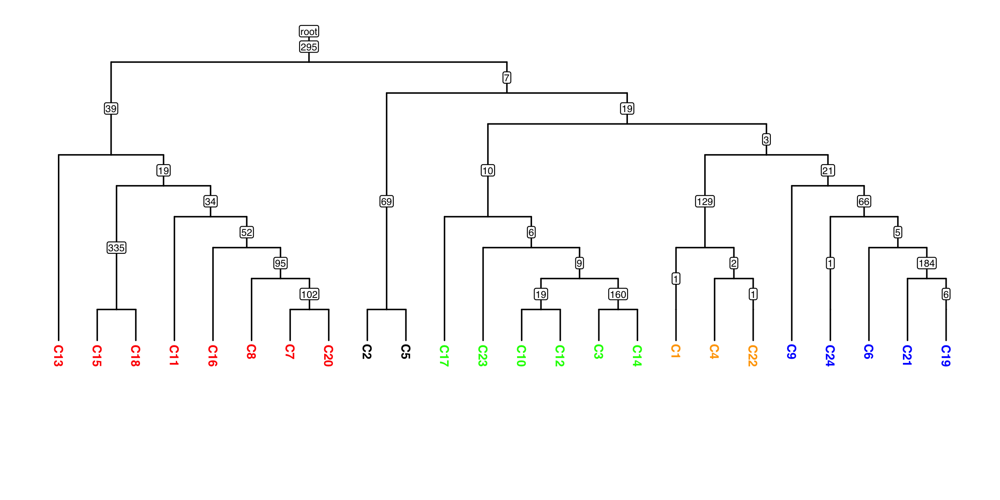

-----------------------------------------------------------------------------------

False positive rate = 0.01
False negative rate = 0.075


Negative Log Likehood of the Inferred Tree: 3366.615182159524


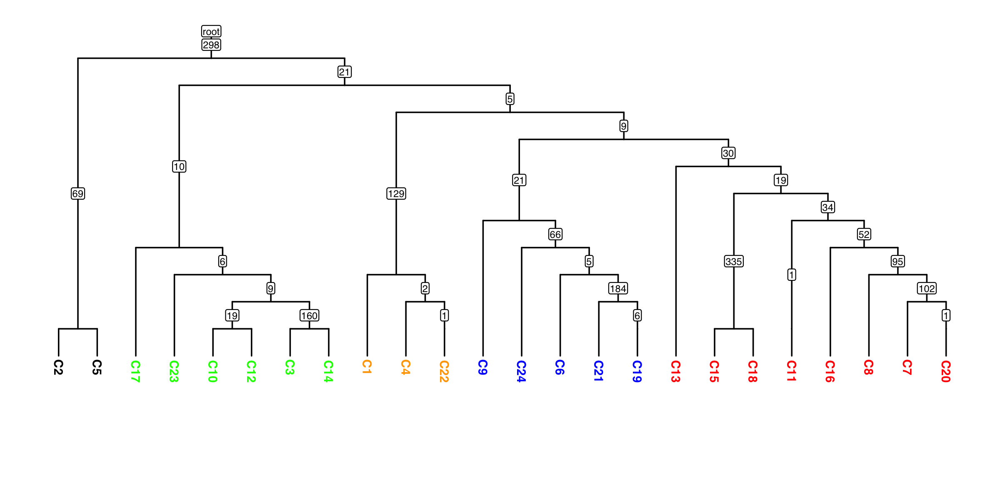

-----------------------------------------------------------------------------------

False positive rate = 0.01
False negative rate = 0.1


Negative Log Likehood of the Inferred Tree: 3431.8183386398346


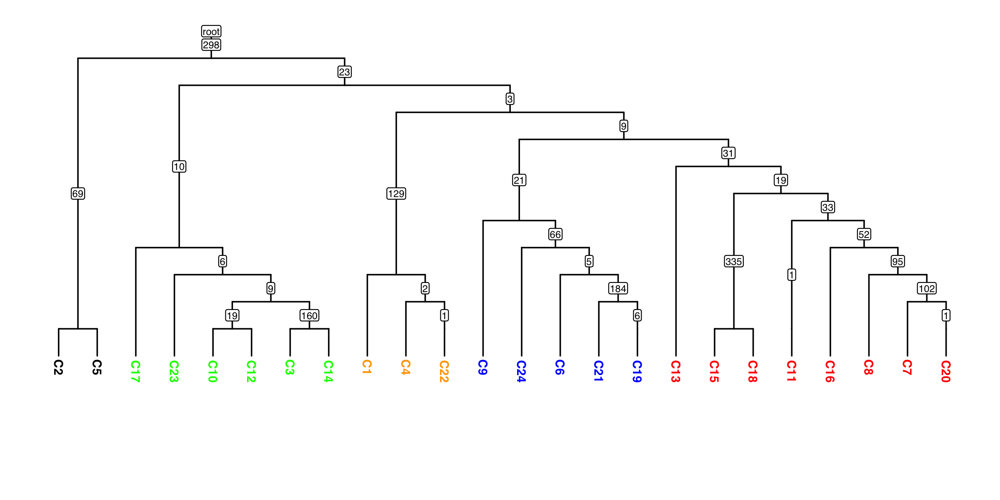

-----------------------------------------------------------------------------------

False positive rate = 0.01
False negative rate = 0.125


Negative Log Likehood of the Inferred Tree: 3554.0083321885527


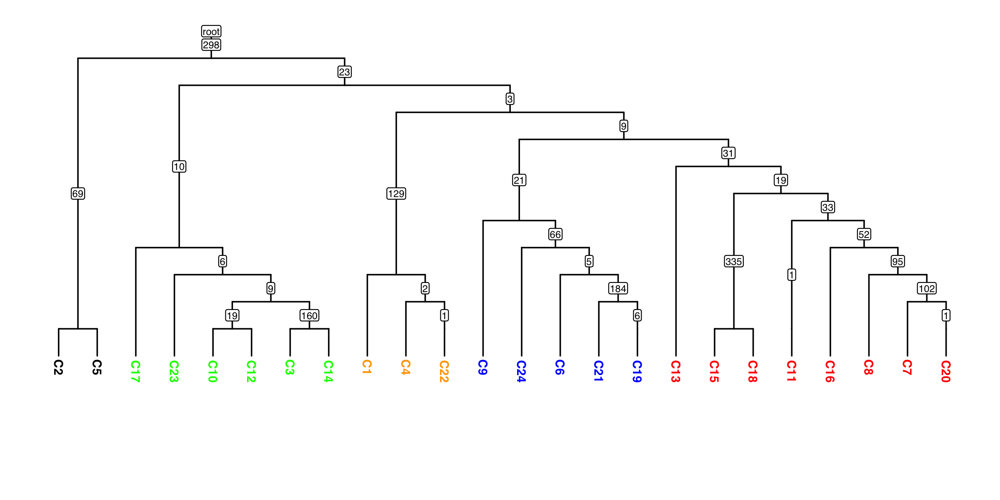

-----------------------------------------------------------------------------------

False positive rate = 0.01
False negative rate = 0.15


Negative Log Likehood of the Inferred Tree: 3717.7623702903493


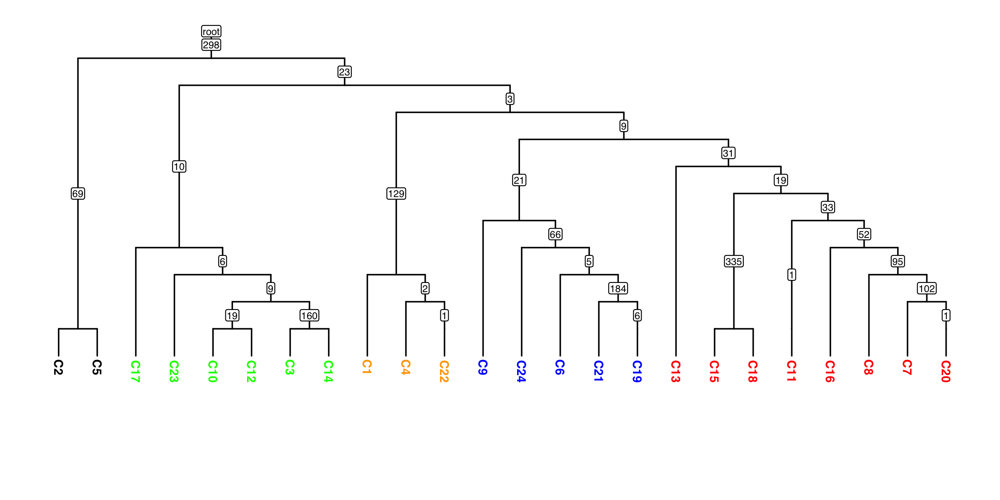

-----------------------------------------------------------------------------------

False positive rate = 0.01
False negative rate = 0.175


Negative Log Likehood of the Inferred Tree: 3913.4310471890562


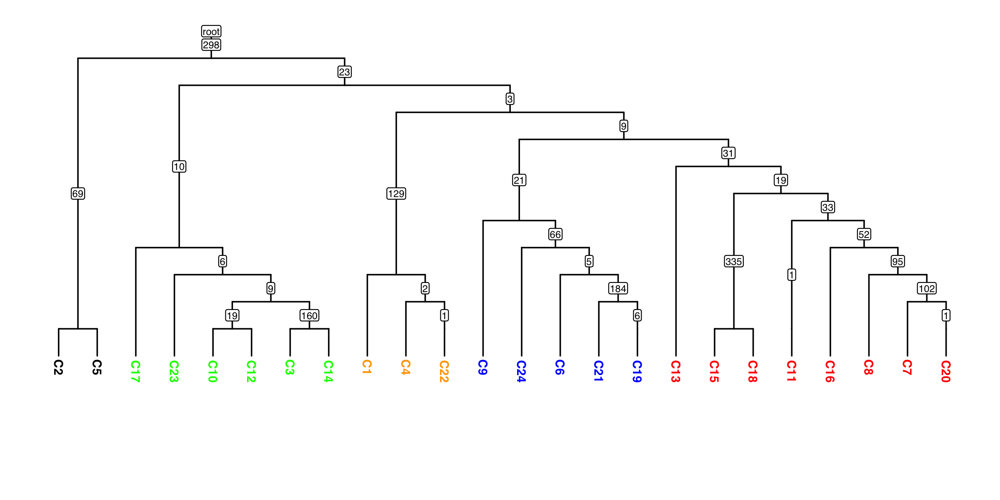

-----------------------------------------------------------------------------------

False positive rate = 0.01
False negative rate = 0.2


Negative Log Likehood of the Inferred Tree: 4138.010001775493


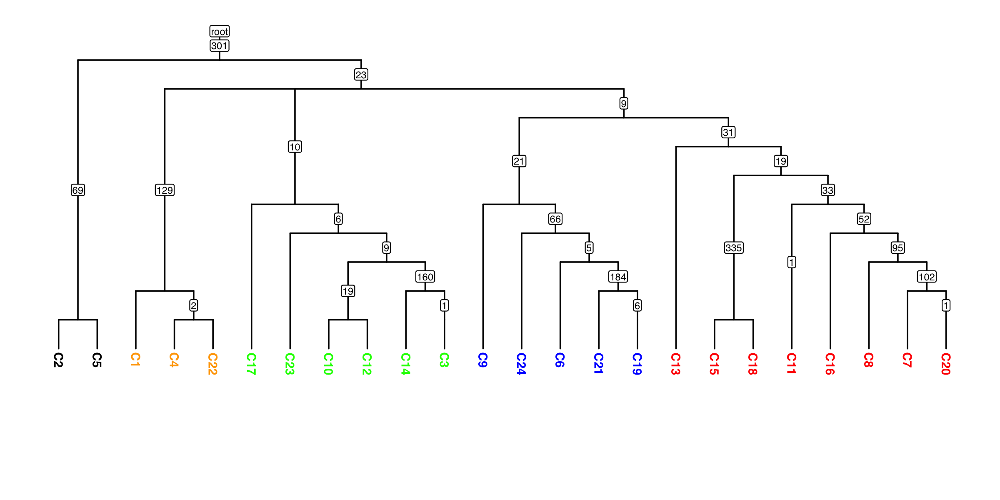

-----------------------------------------------------------------------------------

False positive rate = 0.001
False negative rate = 0.05


Negative Log Likehood of the Inferred Tree: 3228.491697585936


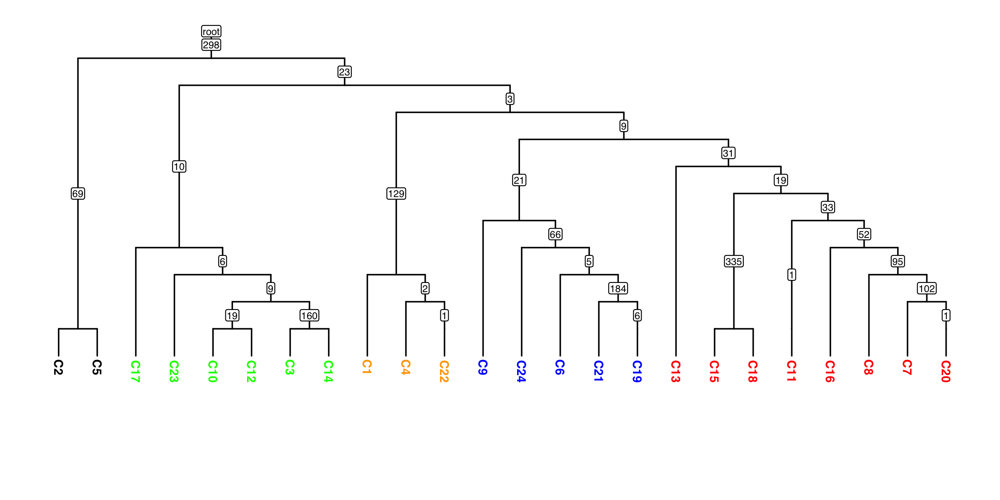

-----------------------------------------------------------------------------------

False positive rate = 0.001
False negative rate = 0.075


Negative Log Likehood of the Inferred Tree: 3188.0080039295412


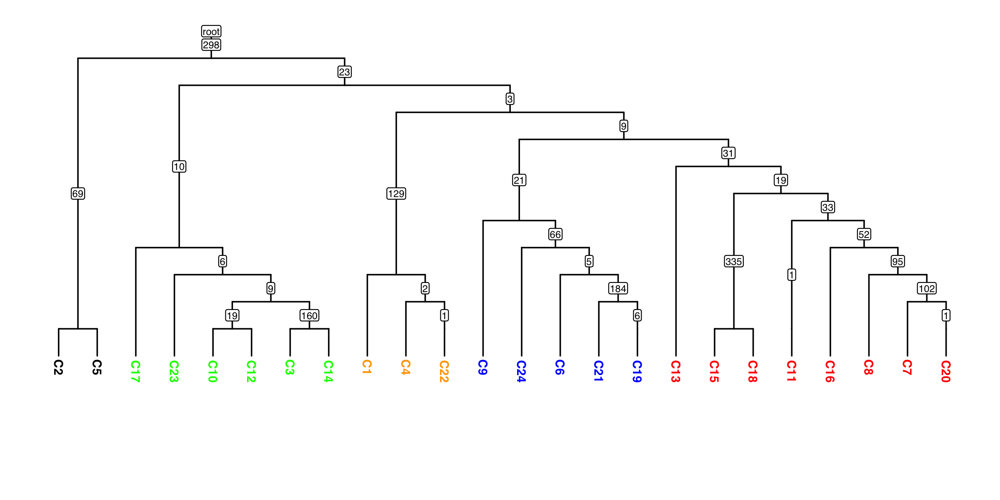

-----------------------------------------------------------------------------------

False positive rate = 0.001
False negative rate = 0.1


Negative Log Likehood of the Inferred Tree: 3250.6591894244416


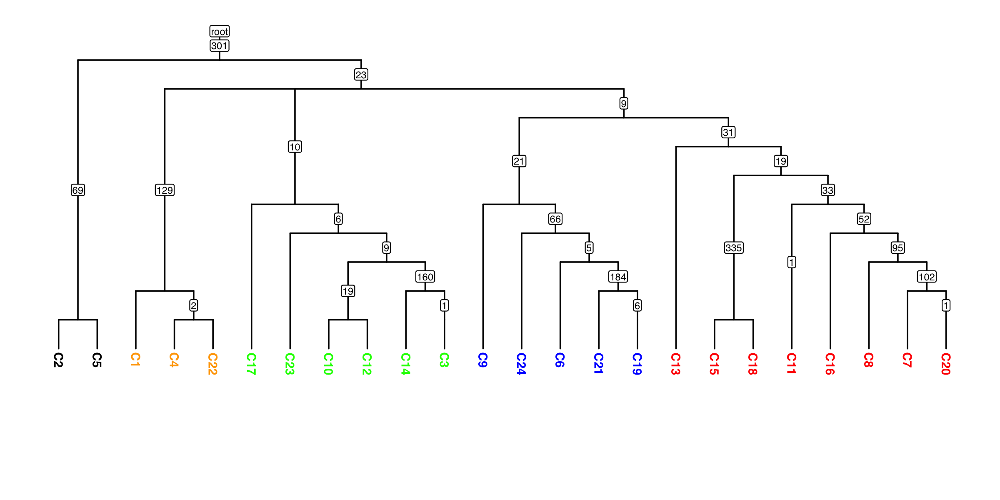

-----------------------------------------------------------------------------------

False positive rate = 0.001
False negative rate = 0.125


Negative Log Likehood of the Inferred Tree: 3369.0016243112286


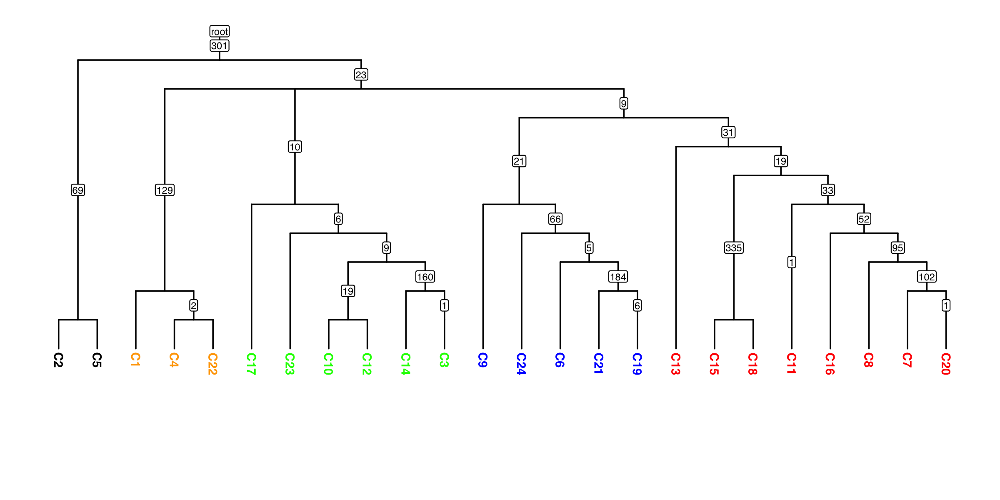

-----------------------------------------------------------------------------------

False positive rate = 0.001
False negative rate = 0.15


Negative Log Likehood of the Inferred Tree: 3529.6477996121066


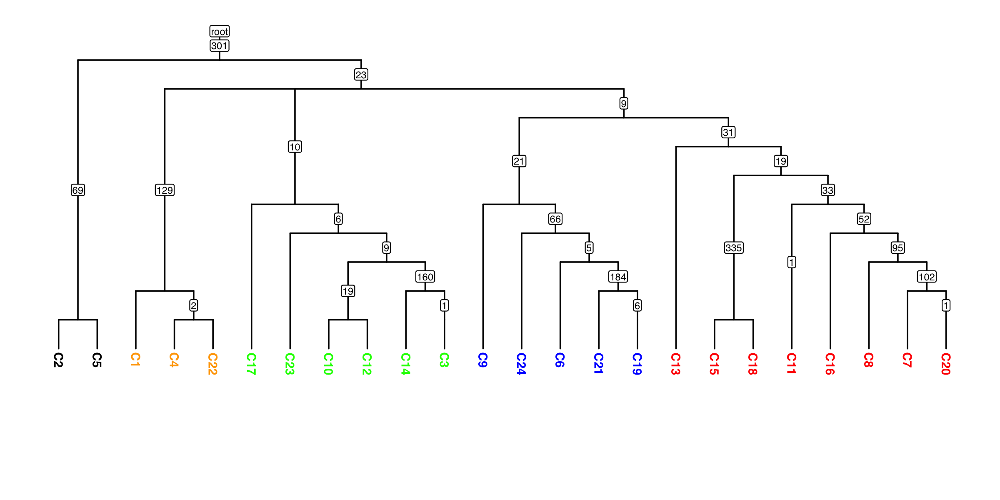

-----------------------------------------------------------------------------------

False positive rate = 0.001
False negative rate = 0.175


Negative Log Likehood of the Inferred Tree: 3723.2258657181424


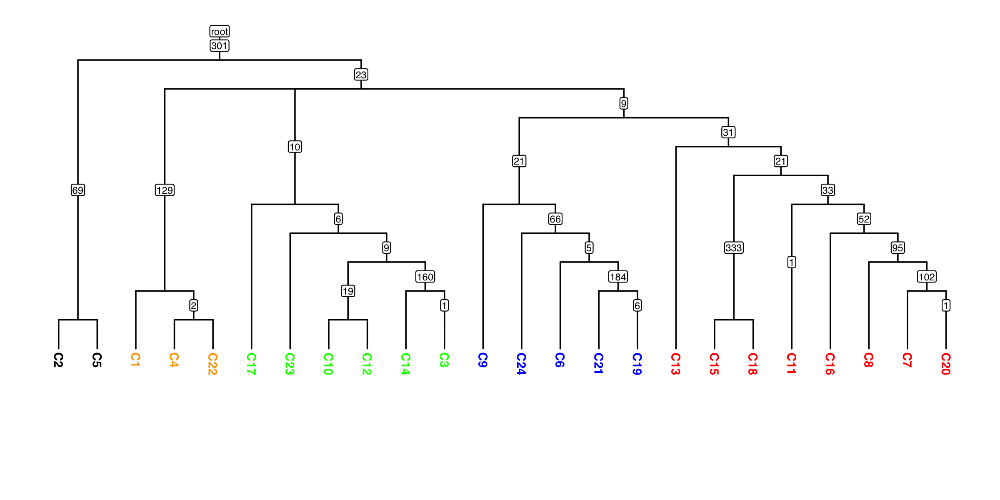

-----------------------------------------------------------------------------------

False positive rate = 0.001
False negative rate = 0.2


Negative Log Likehood of the Inferred Tree: 3942.082360795354


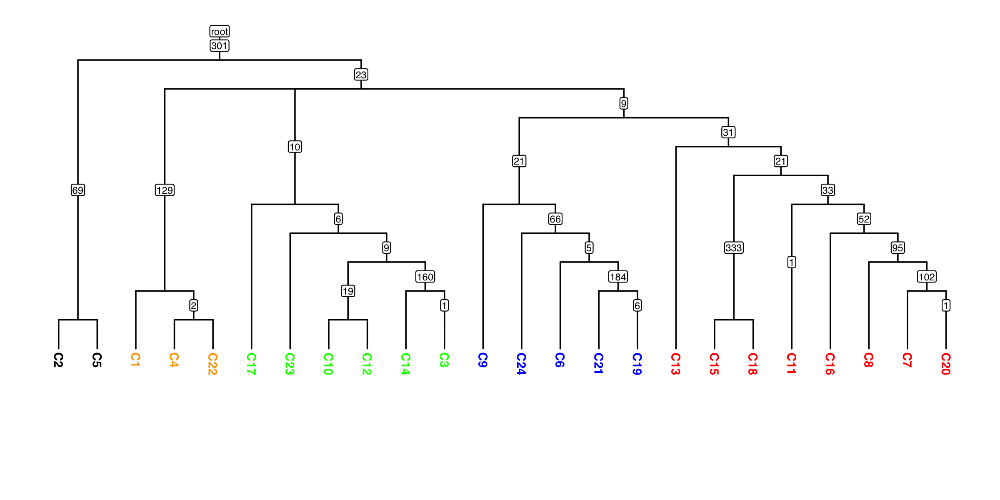

-----------------------------------------------------------------------------------

False positive rate = 0.0001
False negative rate = 0.05


Negative Log Likehood of the Inferred Tree: 3281.943014001011


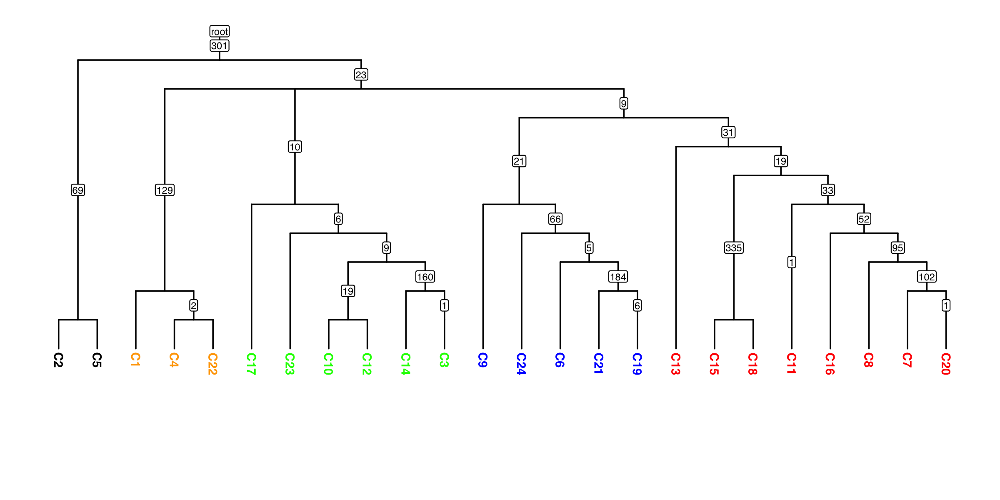

-----------------------------------------------------------------------------------

False positive rate = 0.0001
False negative rate = 0.075


Negative Log Likehood of the Inferred Tree: 3234.3209578812007


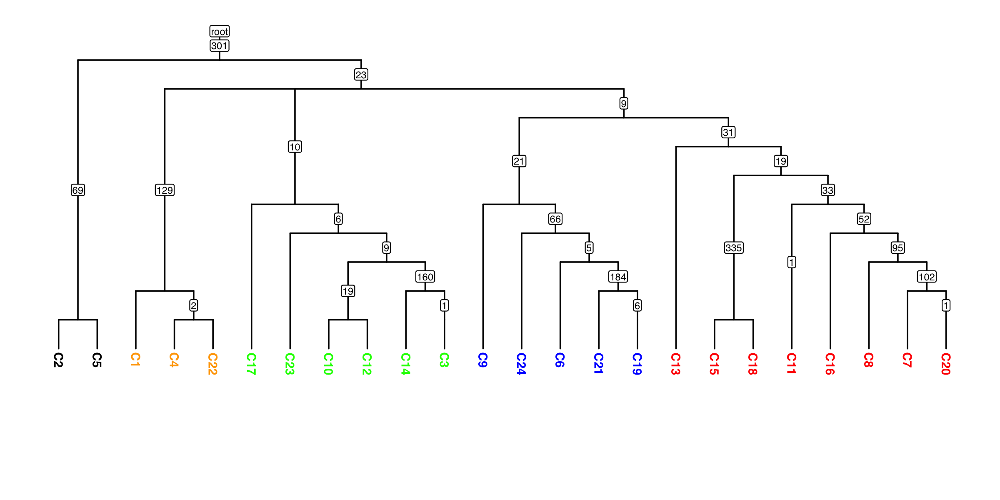

-----------------------------------------------------------------------------------

False positive rate = 0.0001
False negative rate = 0.1


Negative Log Likehood of the Inferred Tree: 3291.554026820481


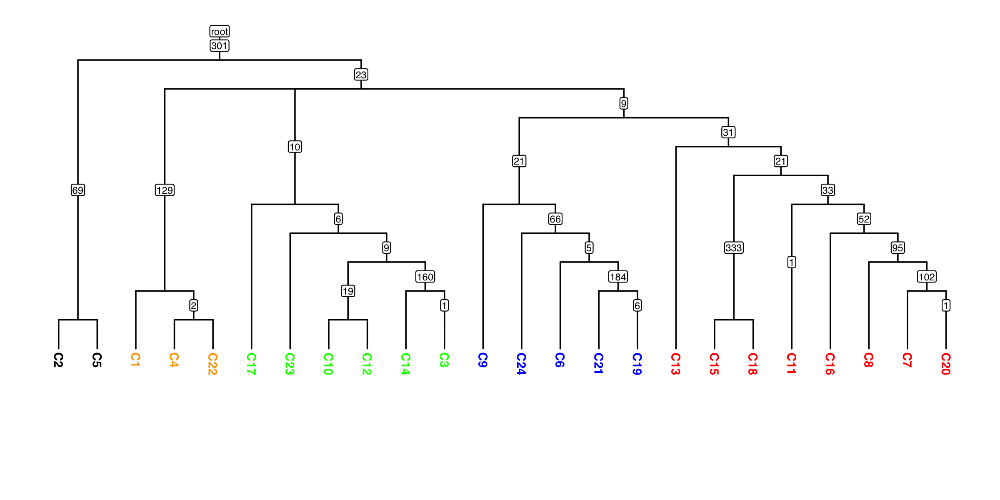

-----------------------------------------------------------------------------------

False positive rate = 0.0001
False negative rate = 0.125


Negative Log Likehood of the Inferred Tree: 3408.167655050729


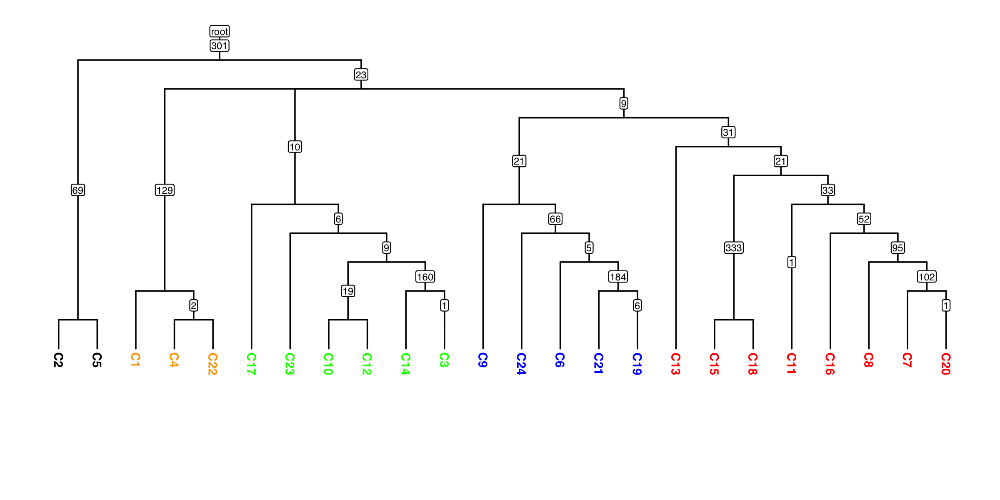

-----------------------------------------------------------------------------------

False positive rate = 0.0001
False negative rate = 0.15


Negative Log Likehood of the Inferred Tree: 3567.413232970893


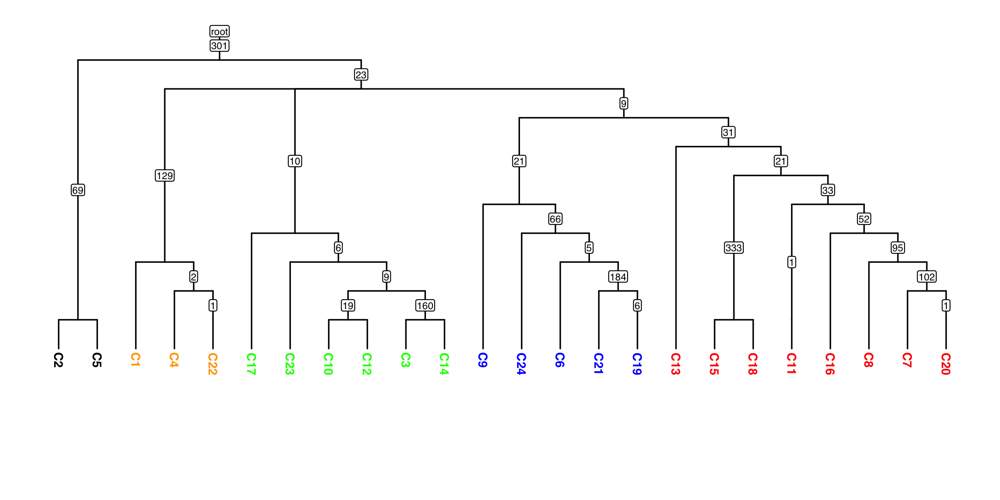

-----------------------------------------------------------------------------------

False positive rate = 0.0001
False negative rate = 0.175


Negative Log Likehood of the Inferred Tree: 3759.312815899291


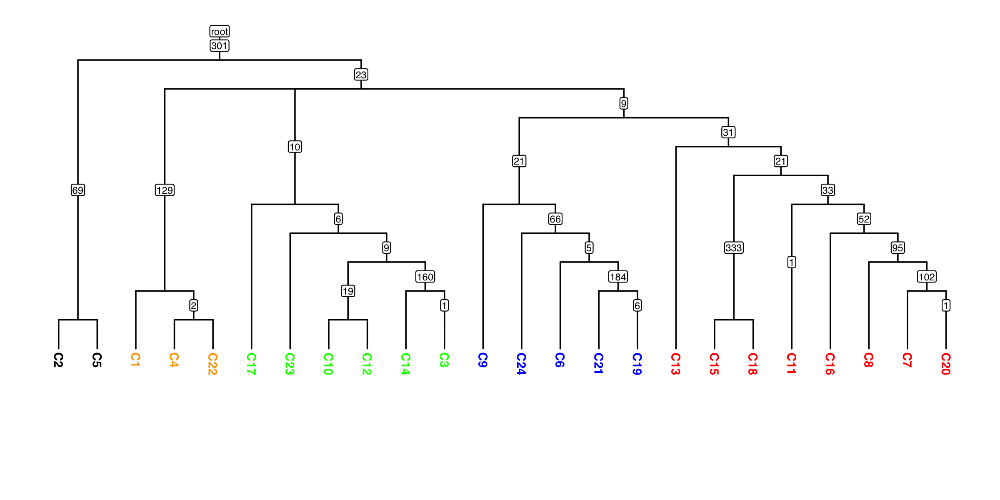

-----------------------------------------------------------------------------------

False positive rate = 0.0001
False negative rate = 0.2


Negative Log Likehood of the Inferred Tree: 3978.169310976151


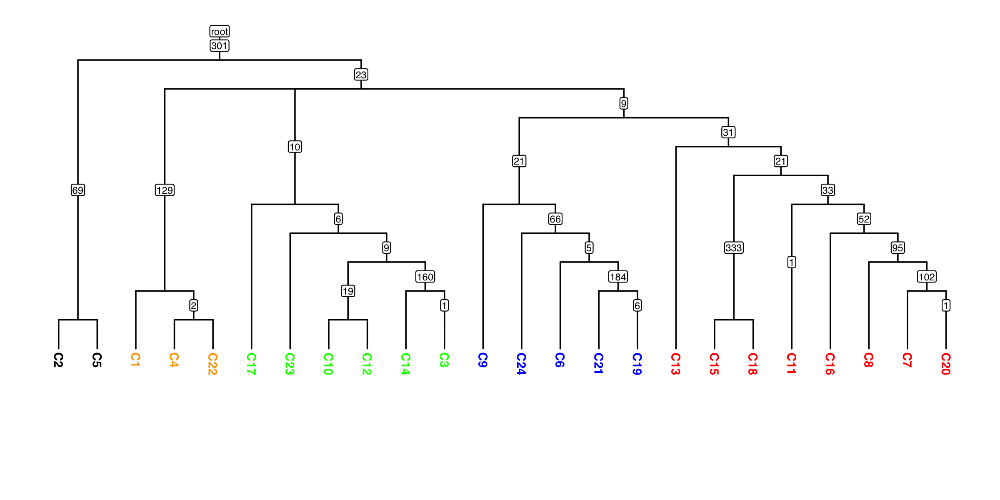

-----------------------------------------------------------------------------------

False positive rate = 1e-05
False negative rate = 0.05


Negative Log Likehood of the Inferred Tree: 3346.110268275563


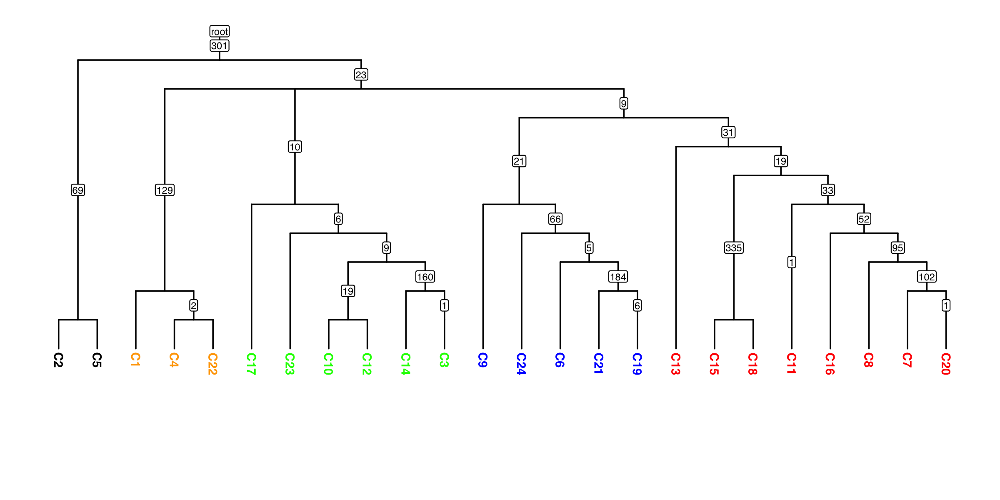

-----------------------------------------------------------------------------------

False positive rate = 1e-05
False negative rate = 0.075


Negative Log Likehood of the Inferred Tree: 3296.340341631852


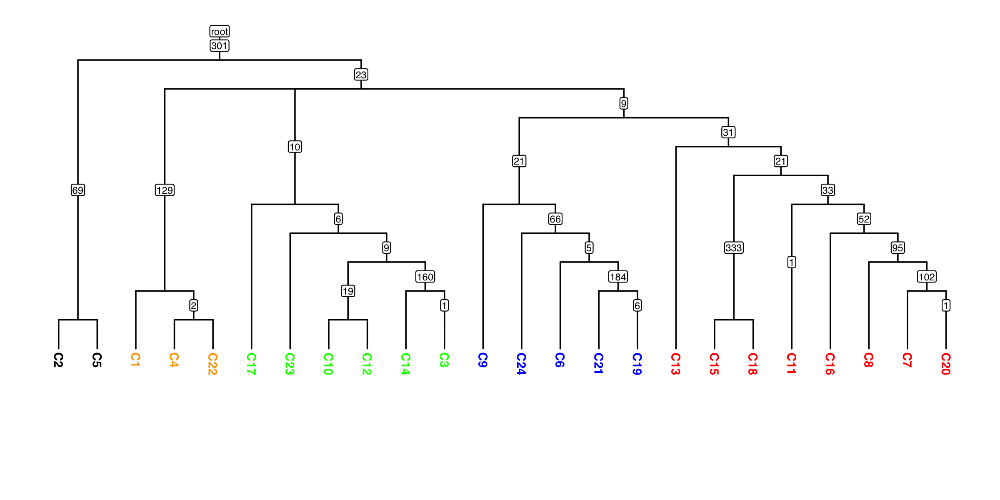

-----------------------------------------------------------------------------------

False positive rate = 1e-05
False negative rate = 0.1


Negative Log Likehood of the Inferred Tree: 3351.116830948571


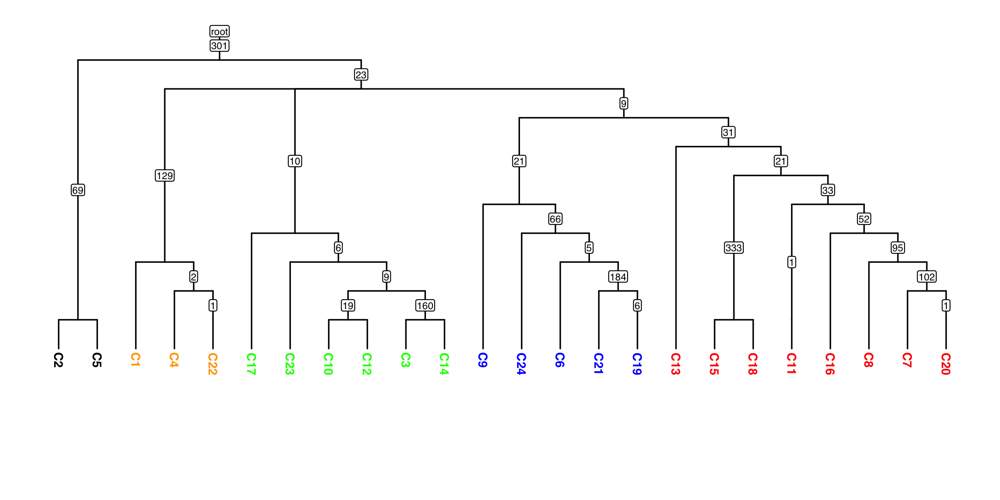

-----------------------------------------------------------------------------------

False positive rate = 1e-05
False negative rate = 0.125


Negative Log Likehood of the Inferred Tree: 3467.730459178867


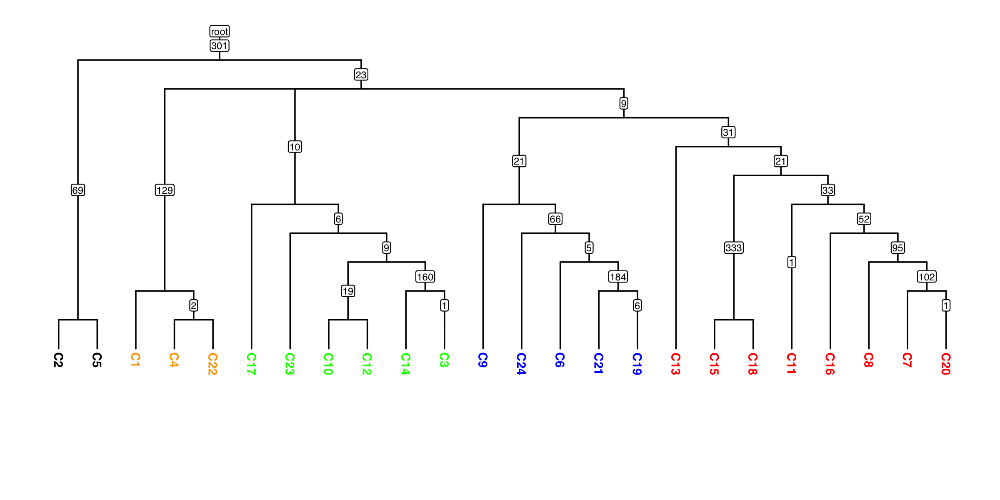

-----------------------------------------------------------------------------------

False positive rate = 1e-05
False negative rate = 0.15


Negative Log Likehood of the Inferred Tree: 3626.9760370992735


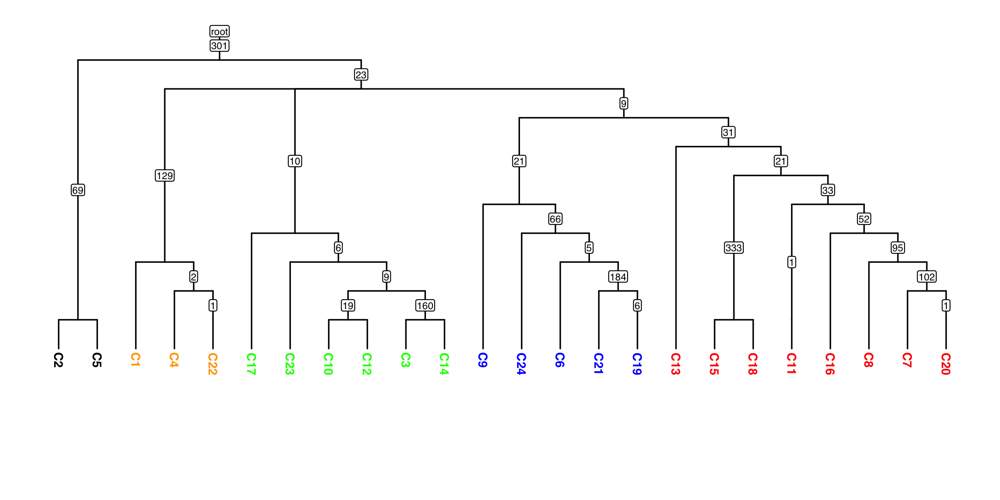

-----------------------------------------------------------------------------------

False positive rate = 1e-05
False negative rate = 0.175


Negative Log Likehood of the Inferred Tree: 3819.7557815906007


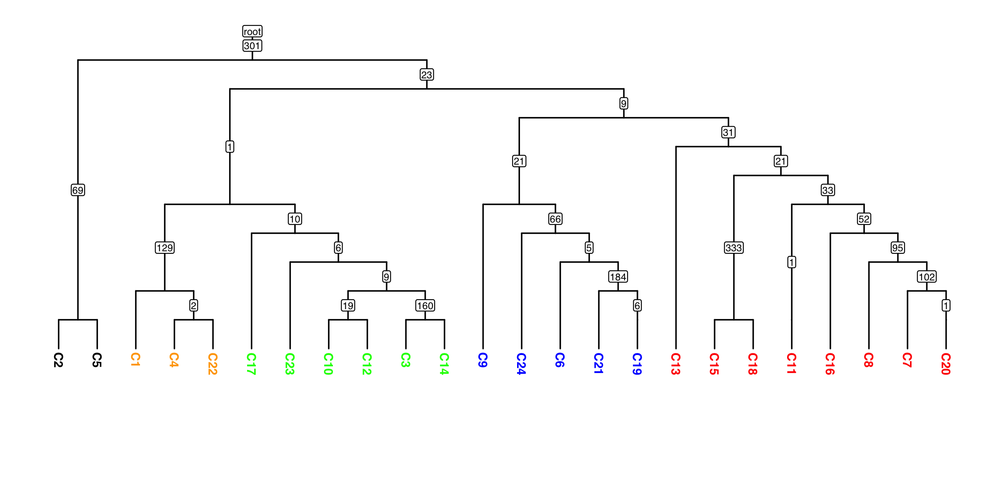

-----------------------------------------------------------------------------------

False positive rate = 1e-05
False negative rate = 0.2


Negative Log Likehood of the Inferred Tree: 4037.7083285781496


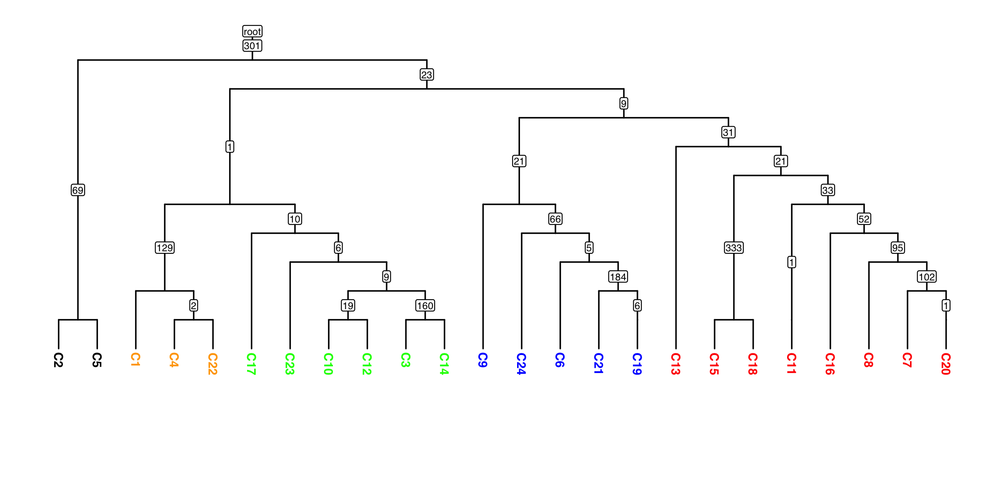

-----------------------------------------------------------------------------------

False positive rate = 1e-06
False negative rate = 0.05


Negative Log Likehood of the Inferred Tree: 3409.061893195962


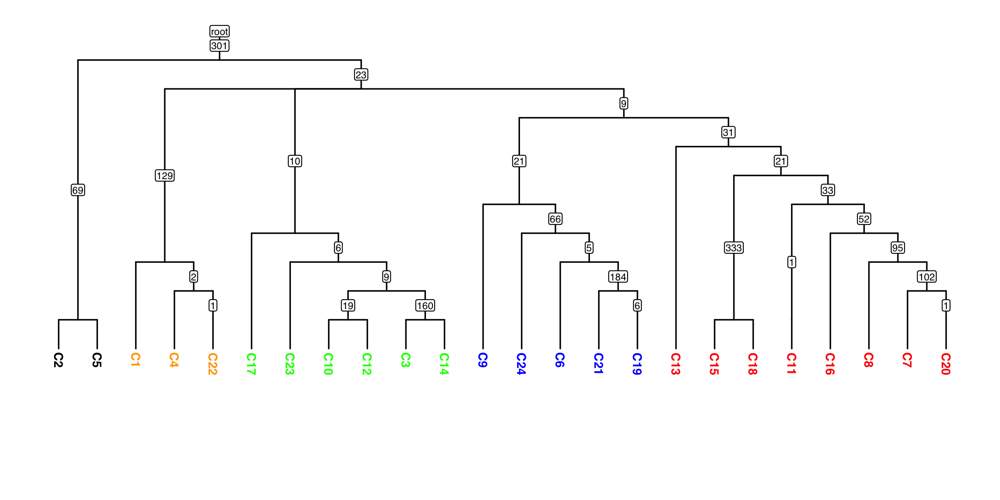

-----------------------------------------------------------------------------------

False positive rate = 1e-06
False negative rate = 0.075


Negative Log Likehood of the Inferred Tree: 3358.249452705467


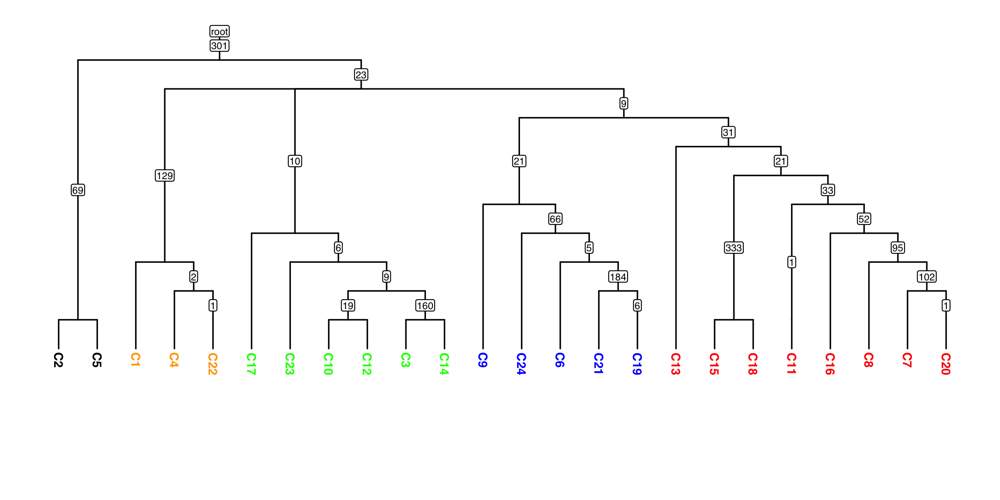

-----------------------------------------------------------------------------------

False positive rate = 1e-06
False negative rate = 0.1


Negative Log Likehood of the Inferred Tree: 3413.0259420222324


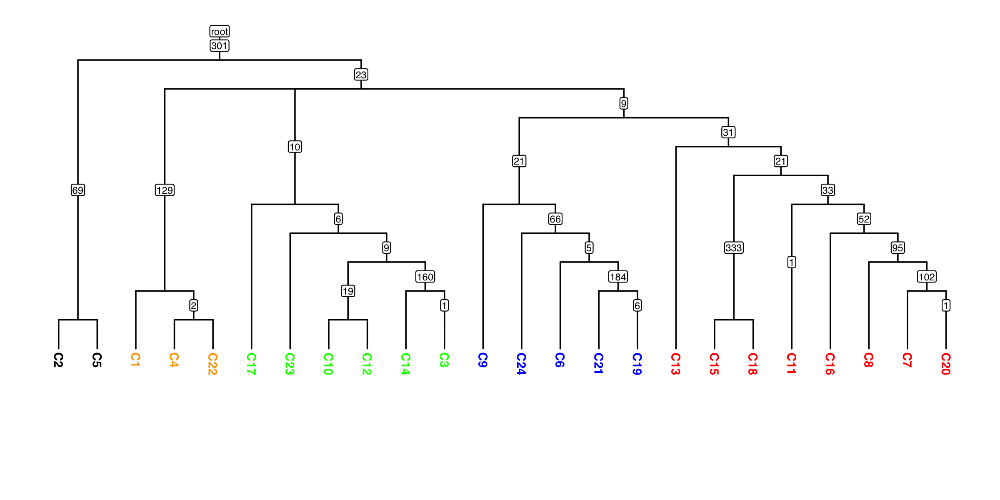

-----------------------------------------------------------------------------------

False positive rate = 1e-06
False negative rate = 0.125


Negative Log Likehood of the Inferred Tree: 3530.5136748788655


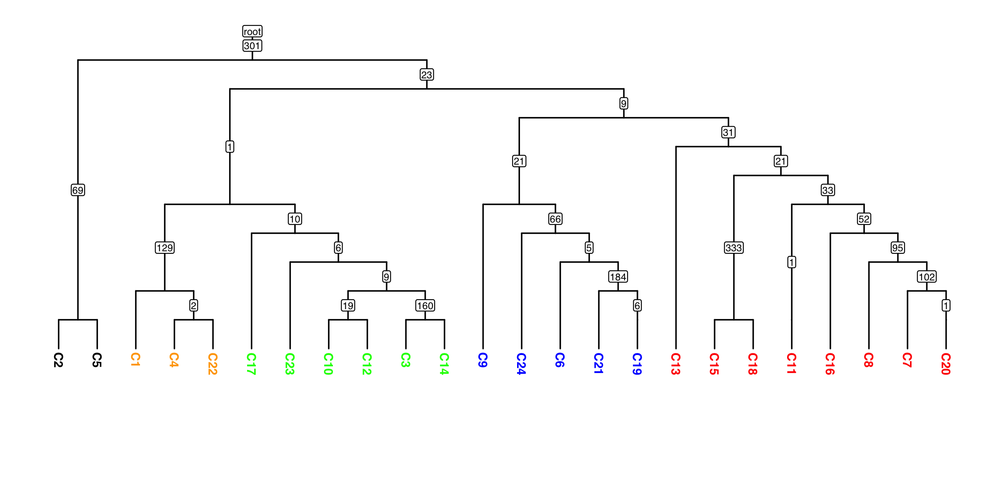

-----------------------------------------------------------------------------------

False positive rate = 1e-06
False negative rate = 0.15


Negative Log Likehood of the Inferred Tree: 3688.5119894383133


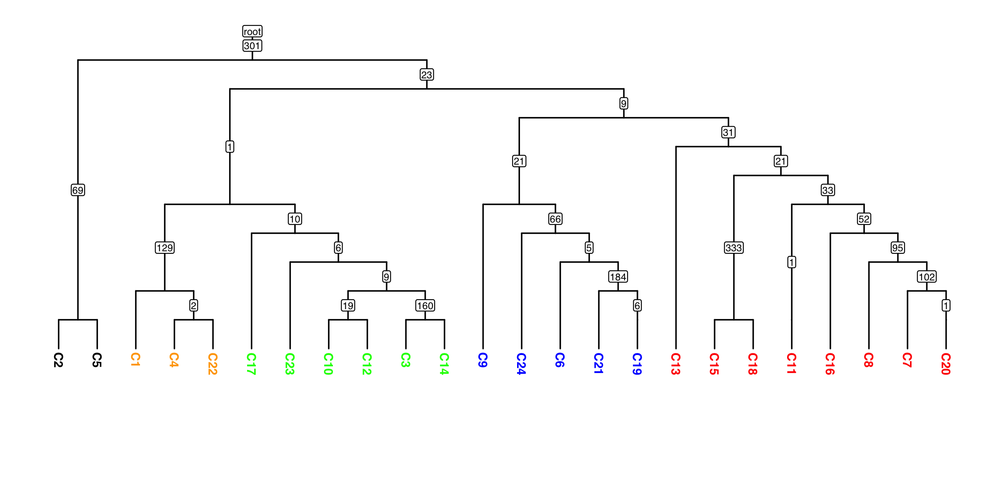

-----------------------------------------------------------------------------------

False positive rate = 1e-06
False negative rate = 0.175


Negative Log Likehood of the Inferred Tree: 3879.3623705709724


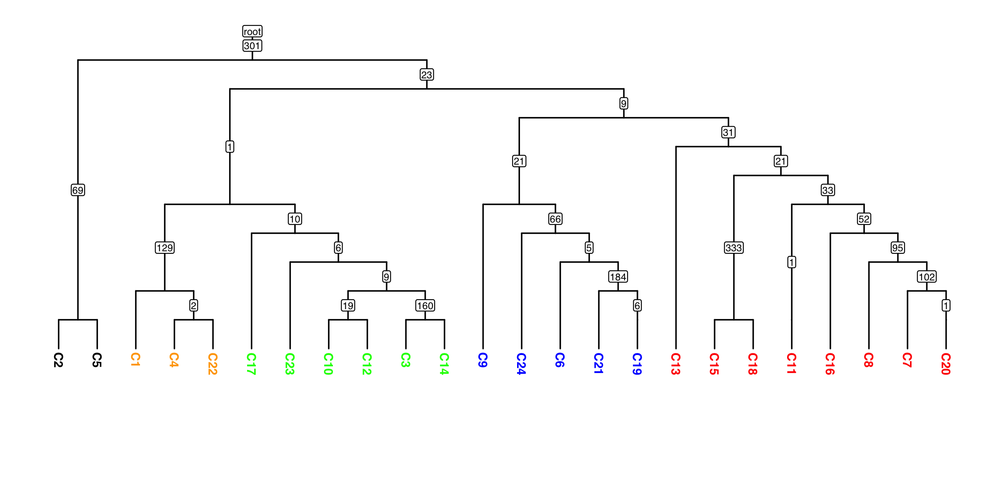

-----------------------------------------------------------------------------------

False positive rate = 1e-06
False negative rate = 0.2


Negative Log Likehood of the Inferred Tree: 4093.3509765963395


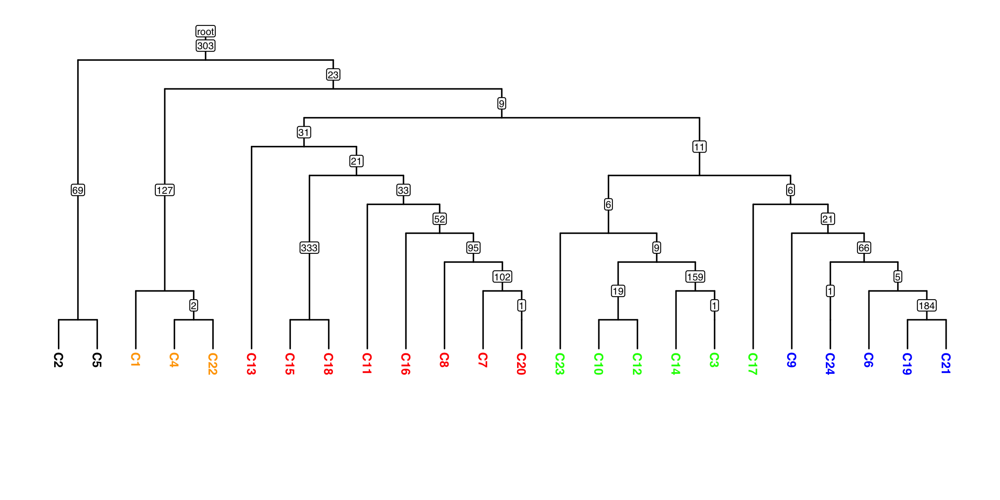

-----------------------------------------------------------------------------------

Tree inference has been completed successfully. For the best tree, check the folder ./output/before_input_correction/fp_0.001-fn_0.075



In [6]:
# Tree inference
uncorrected_data_output_folder = os.path.join(parent_output_folder, "before_input_correction")
E = infer_tree(D, uncorrected_data_output_folder)


False positive rate = 0.01
False negative rate = 0.05


Negative Log Likehood of the Inferred Tree: 3308.8338835203167


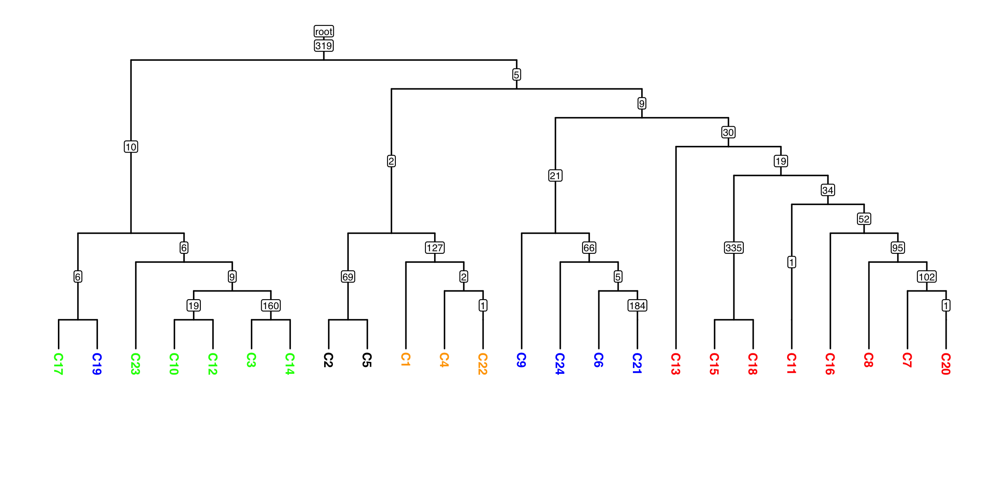

-----------------------------------------------------------------------------------

False positive rate = 0.01
False negative rate = 0.075


Negative Log Likehood of the Inferred Tree: 3265.2310824799238


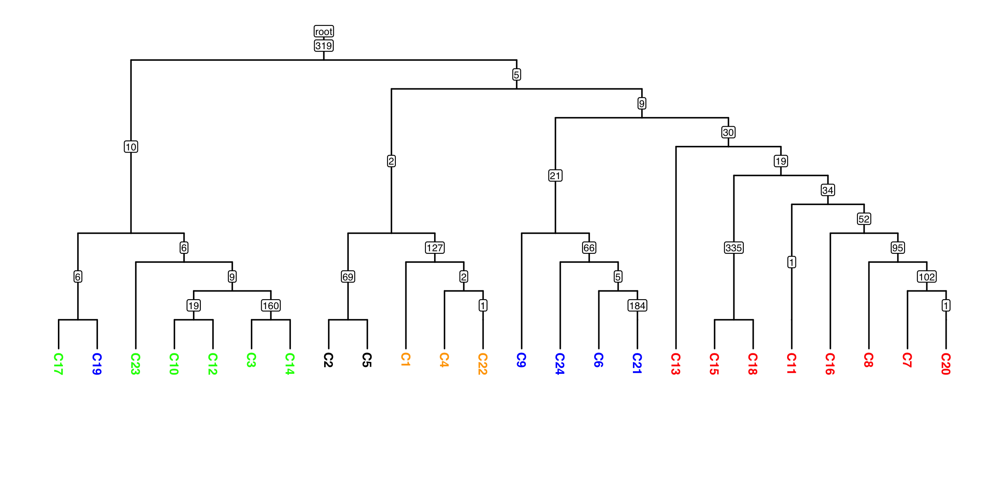

-----------------------------------------------------------------------------------

False positive rate = 0.01
False negative rate = 0.1


Negative Log Likehood of the Inferred Tree: 3322.85987039875


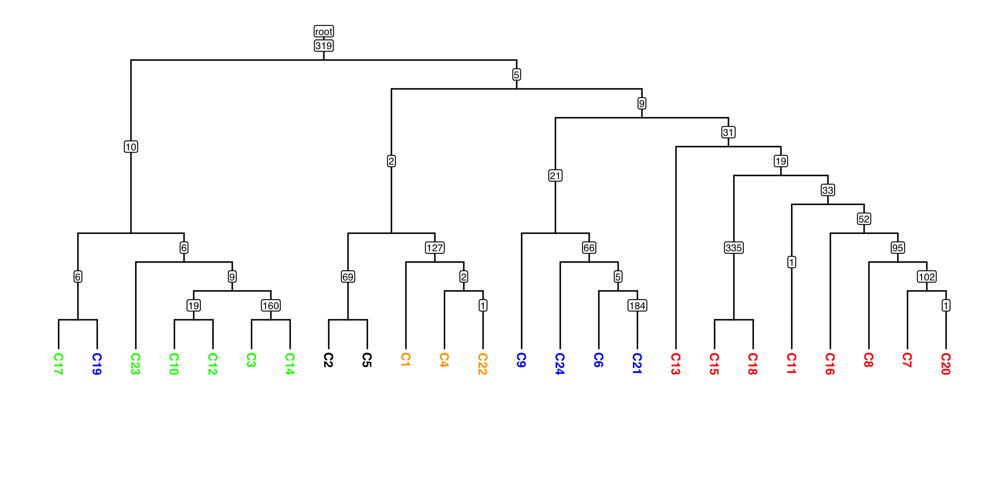

-----------------------------------------------------------------------------------

False positive rate = 0.01
False negative rate = 0.125


Negative Log Likehood of the Inferred Tree: 3439.2852173309166


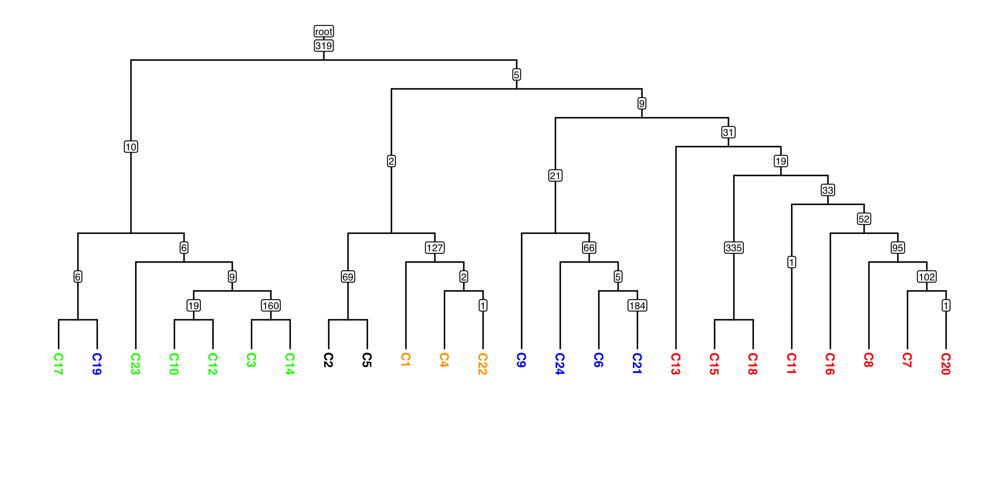

-----------------------------------------------------------------------------------

False positive rate = 0.01
False negative rate = 0.15


Negative Log Likehood of the Inferred Tree: 3597.829259469461


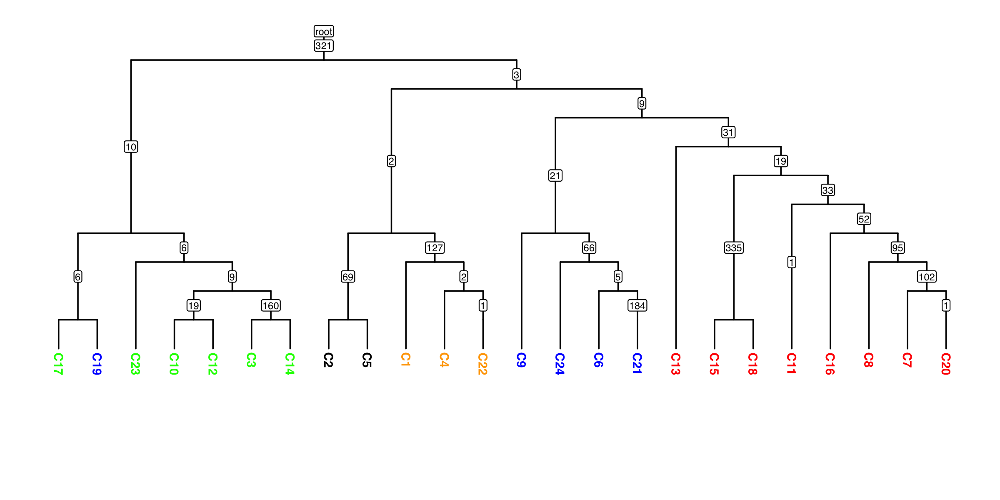

-----------------------------------------------------------------------------------

False positive rate = 0.01
False negative rate = 0.175


Negative Log Likehood of the Inferred Tree: 3785.3084527370265


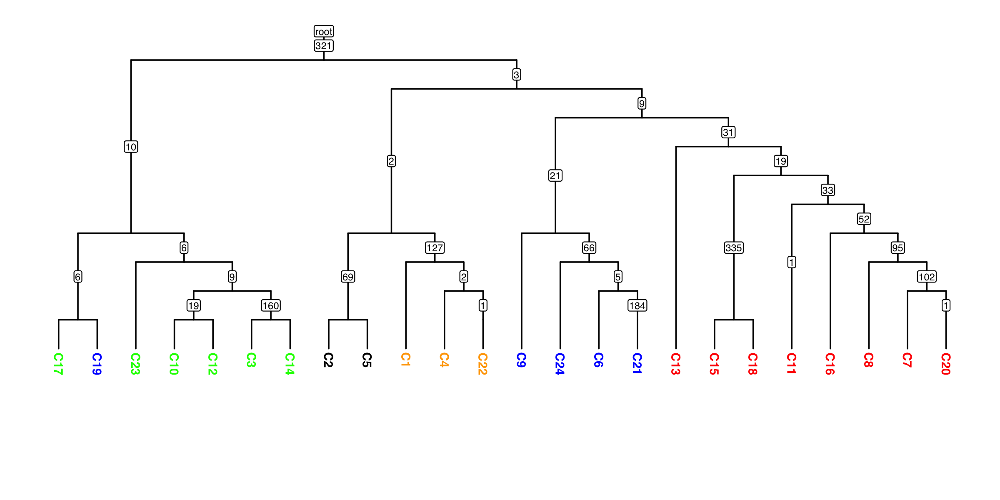

-----------------------------------------------------------------------------------

False positive rate = 0.01
False negative rate = 0.2


Negative Log Likehood of the Inferred Tree: 3998.9998100798034


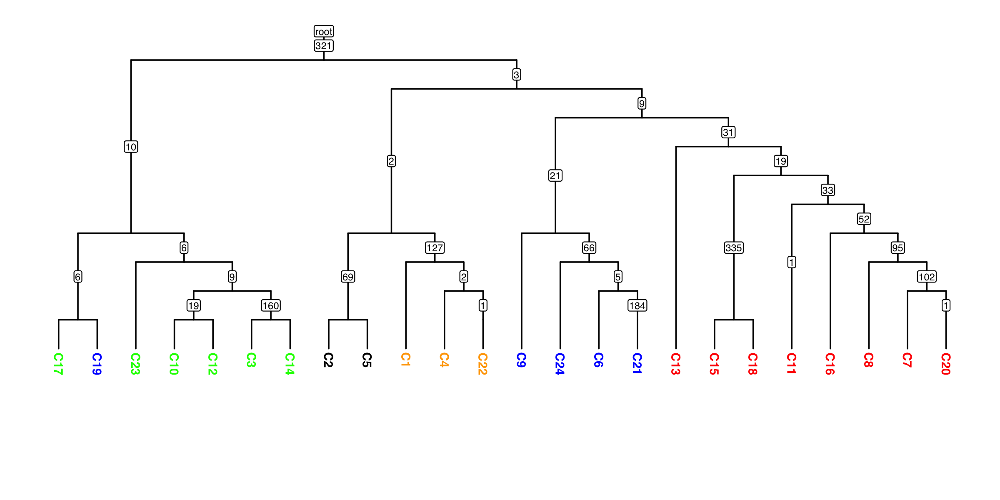

-----------------------------------------------------------------------------------

False positive rate = 0.001
False negative rate = 0.05


Negative Log Likehood of the Inferred Tree: 3077.8522715325744


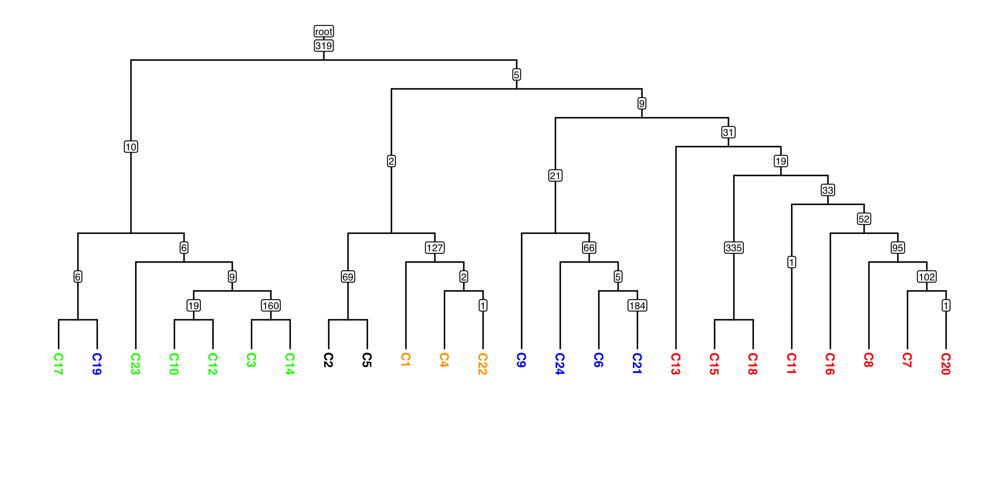

-----------------------------------------------------------------------------------

False positive rate = 0.001
False negative rate = 0.075


Negative Log Likehood of the Inferred Tree: 3032.0387002240486


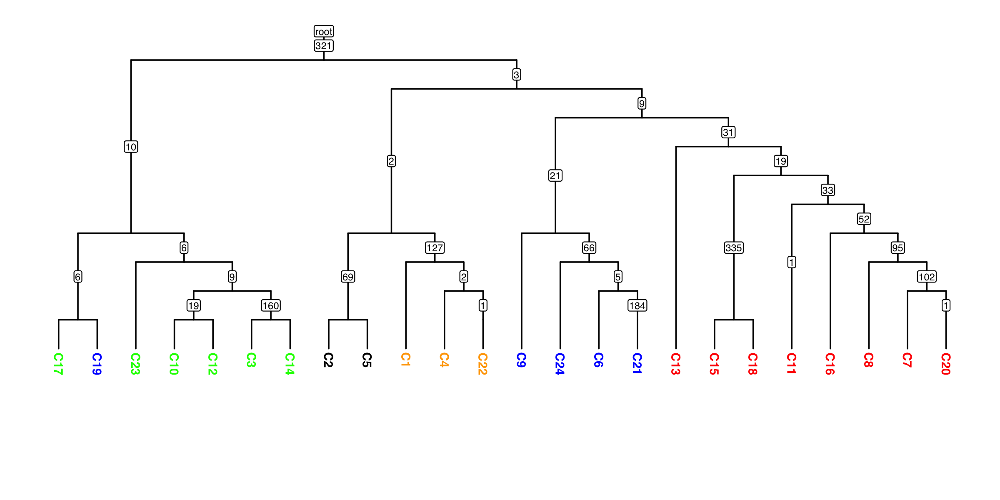

-----------------------------------------------------------------------------------

False positive rate = 0.001
False negative rate = 0.1


Negative Log Likehood of the Inferred Tree: 3086.2670383003883


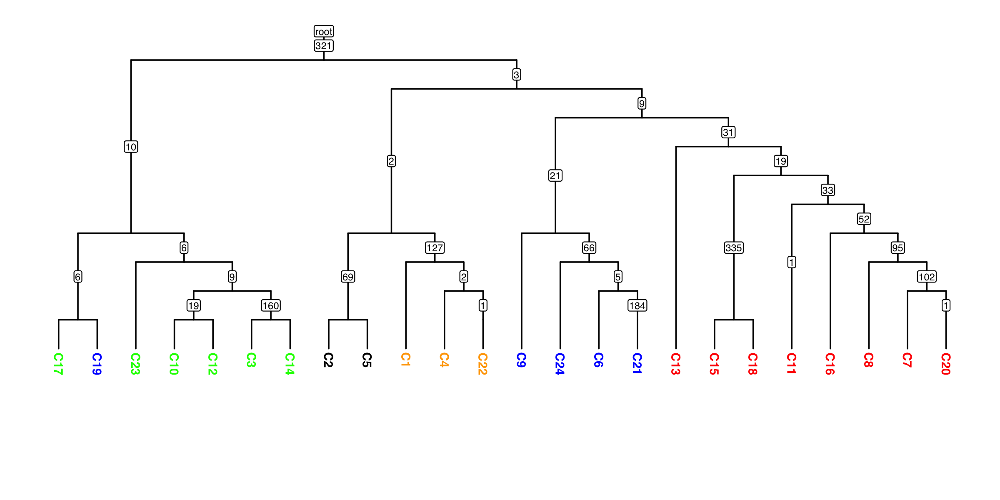

-----------------------------------------------------------------------------------

False positive rate = 0.001
False negative rate = 0.125


Negative Log Likehood of the Inferred Tree: 3200.5736332271795


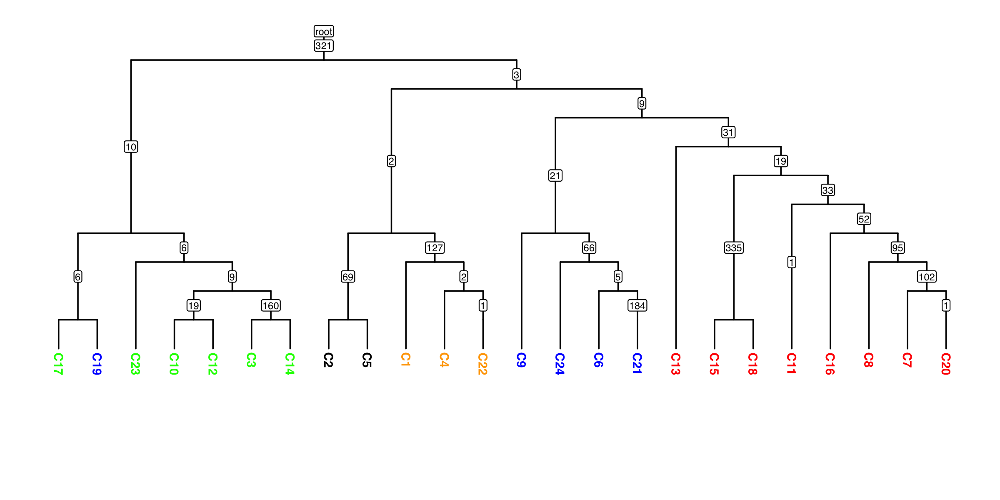

-----------------------------------------------------------------------------------

False positive rate = 0.001
False negative rate = 0.15


Negative Log Likehood of the Inferred Tree: 3356.3103184810343


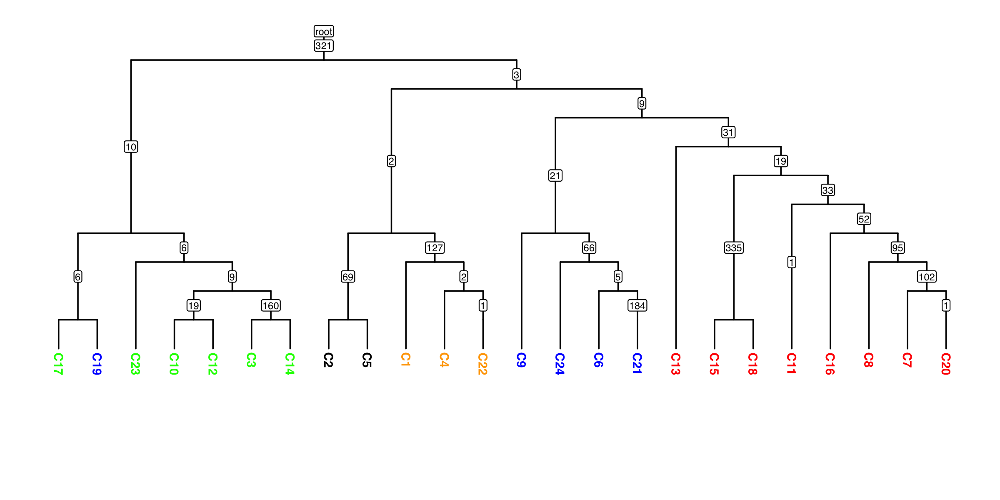

-----------------------------------------------------------------------------------

False positive rate = 0.001
False negative rate = 0.175


Negative Log Likehood of the Inferred Tree: 3544.294495413959


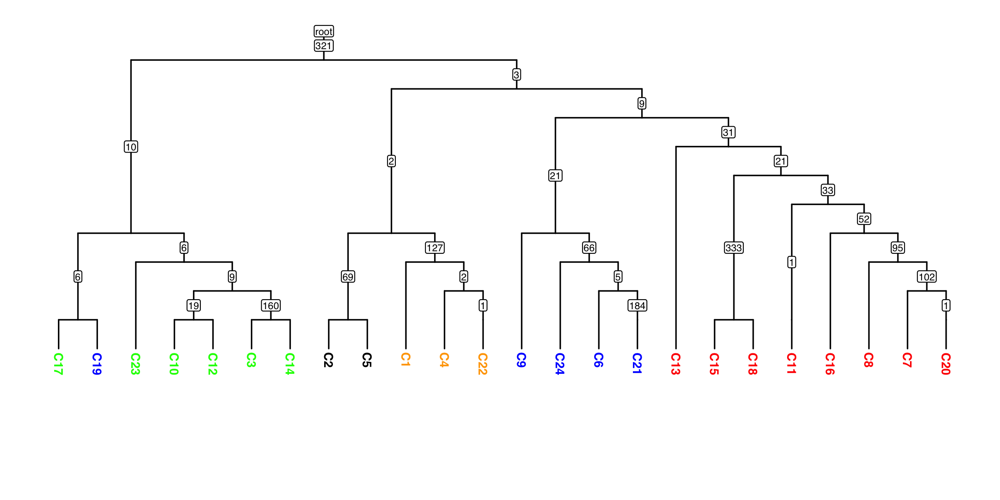

-----------------------------------------------------------------------------------

False positive rate = 0.001
False negative rate = 0.2


Negative Log Likehood of the Inferred Tree: 3756.979144933146


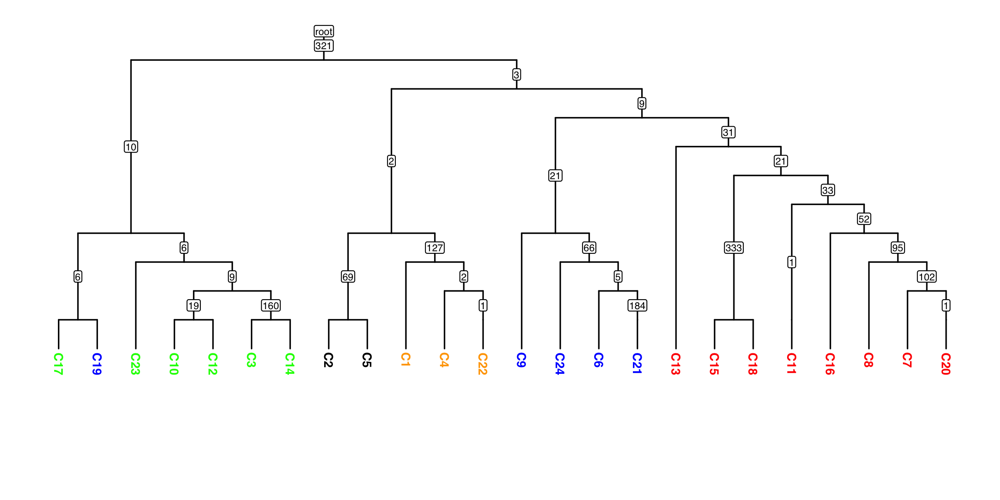

-----------------------------------------------------------------------------------

False positive rate = 0.0001
False negative rate = 0.05


Negative Log Likehood of the Inferred Tree: 3077.0763126727734


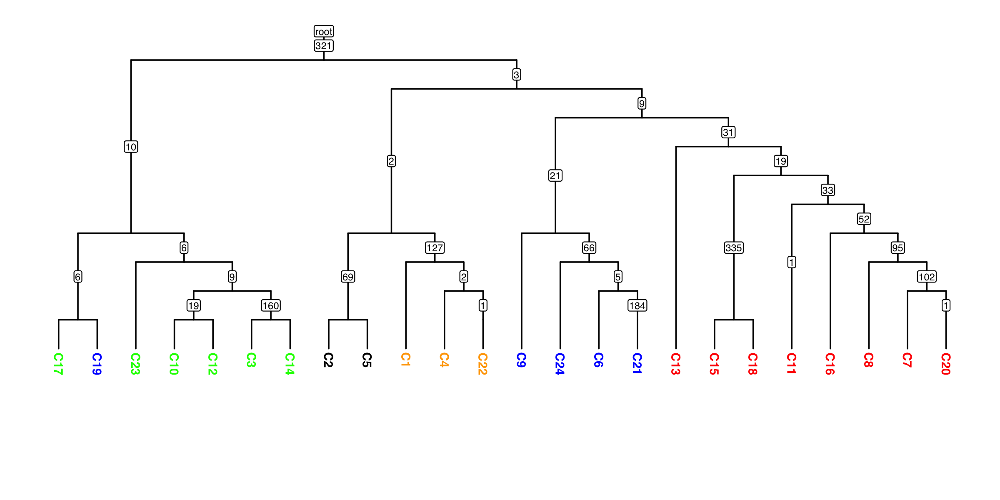

-----------------------------------------------------------------------------------

False positive rate = 0.0001
False negative rate = 0.075


Negative Log Likehood of the Inferred Tree: 3028.7412715704404


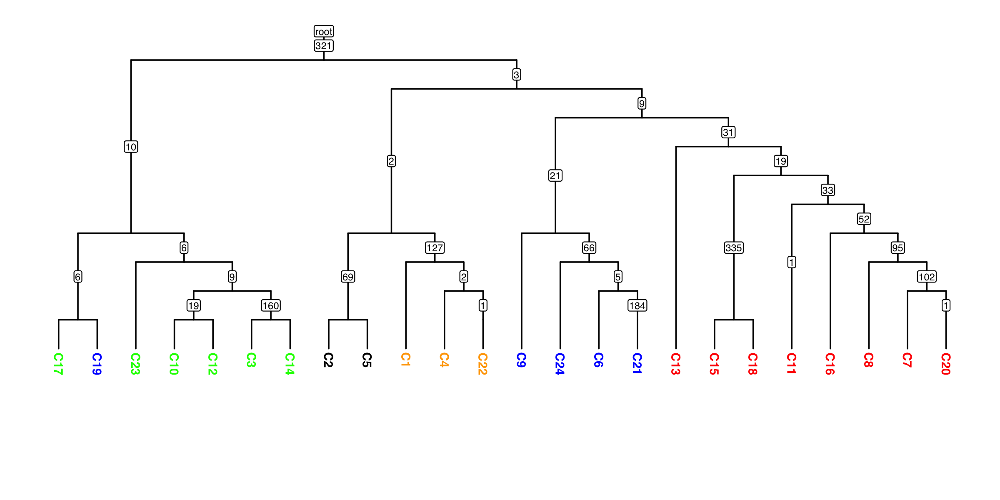

-----------------------------------------------------------------------------------

False positive rate = 0.0001
False negative rate = 0.1


Negative Log Likehood of the Inferred Tree: 3083.179530638149


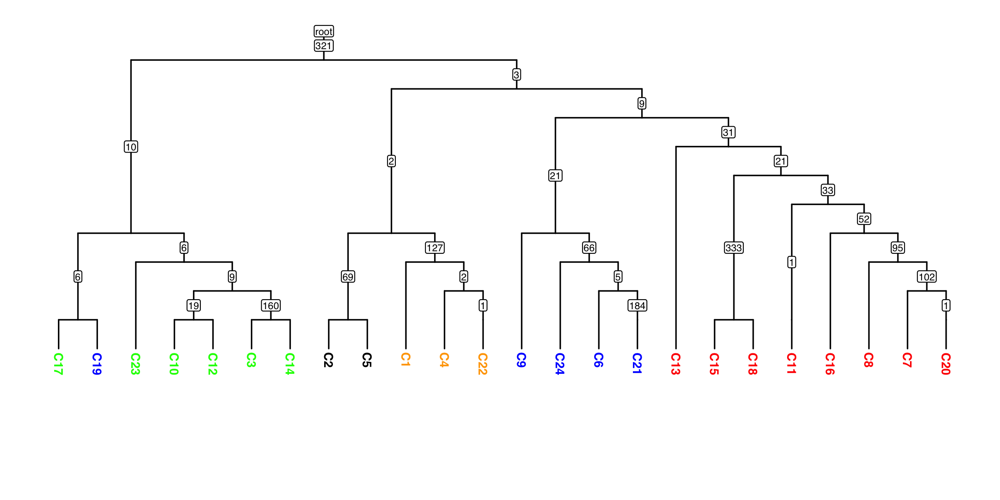

-----------------------------------------------------------------------------------

False positive rate = 0.0001
False negative rate = 0.125


Negative Log Likehood of the Inferred Tree: 3195.7573189084337


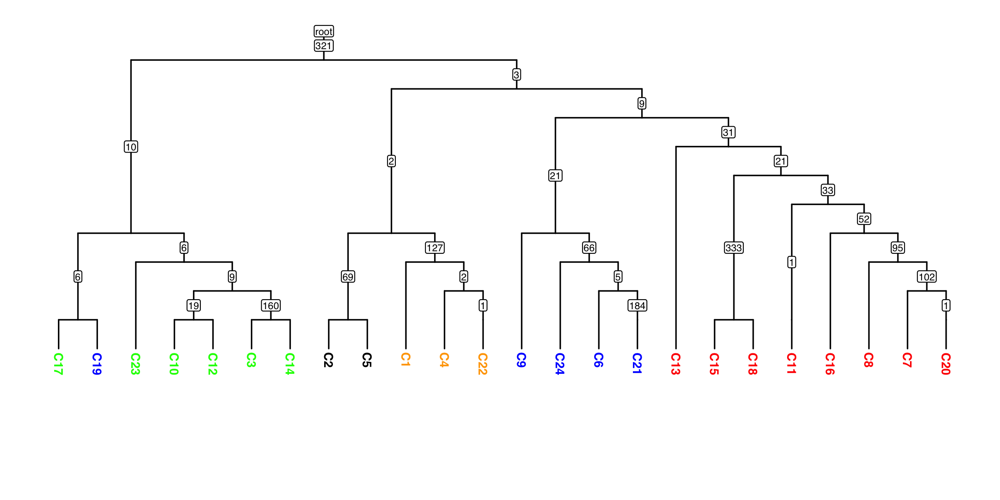

-----------------------------------------------------------------------------------

False positive rate = 0.0001
False negative rate = 0.15


Negative Log Likehood of the Inferred Tree: 3350.0934067815856


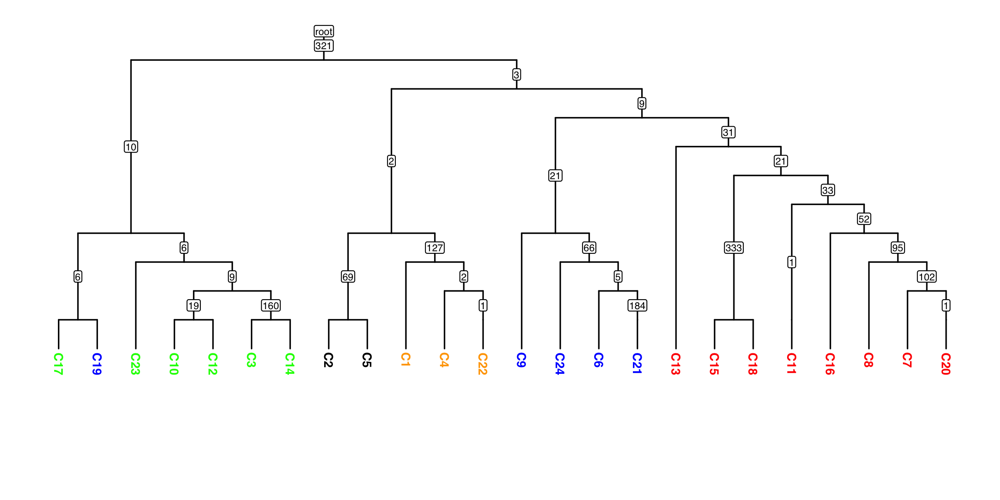

-----------------------------------------------------------------------------------

False positive rate = 0.0001
False negative rate = 0.175


Negative Log Likehood of the Inferred Tree: 3536.3991005368607


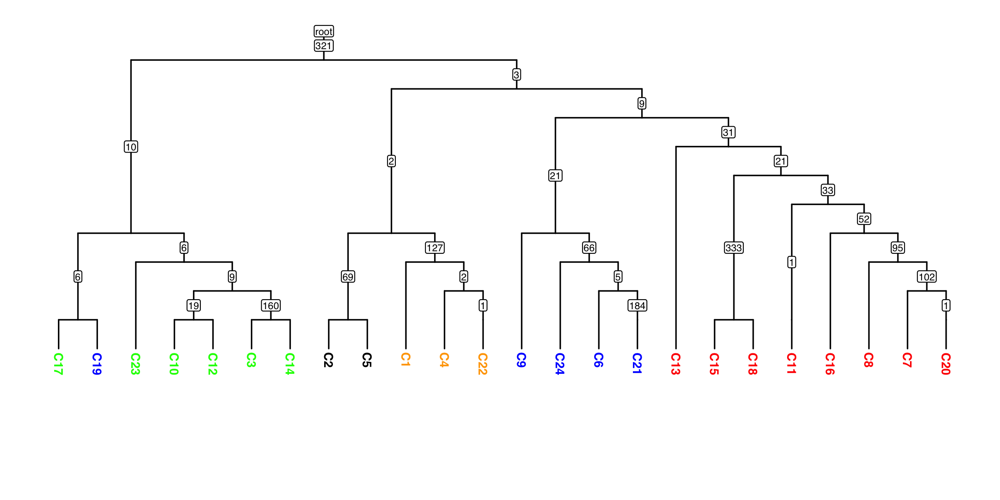

-----------------------------------------------------------------------------------

False positive rate = 0.0001
False negative rate = 0.2


Negative Log Likehood of the Inferred Tree: 3749.0837500556686


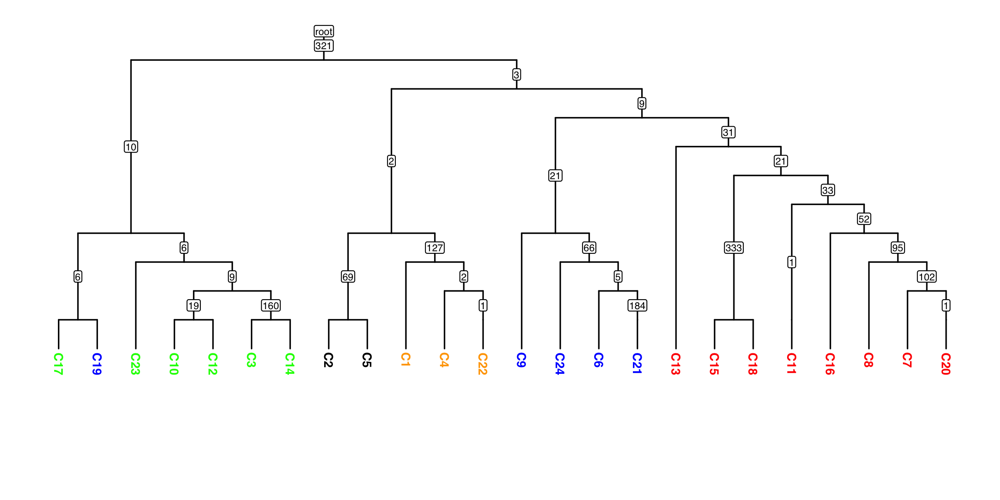

-----------------------------------------------------------------------------------

False positive rate = 1e-05
False negative rate = 0.05


Negative Log Likehood of the Inferred Tree: 3097.471138898375


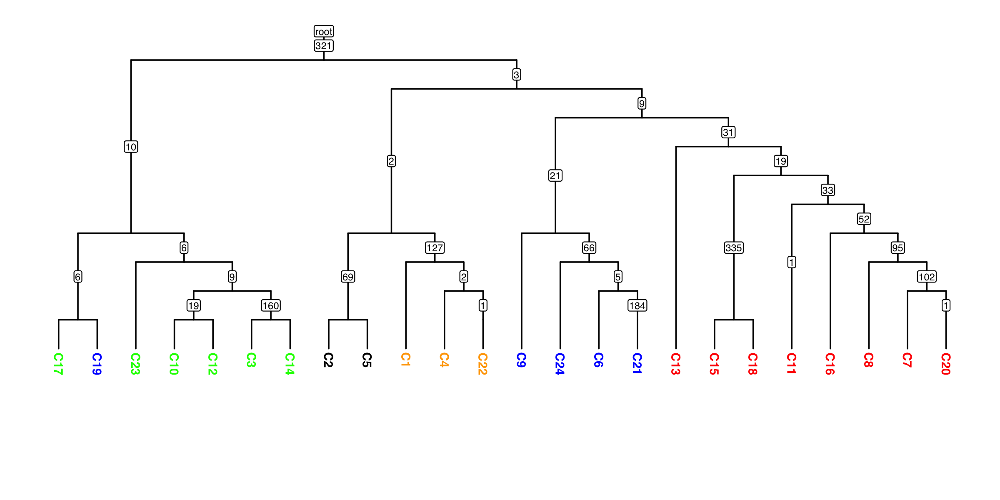

-----------------------------------------------------------------------------------

False positive rate = 1e-05
False negative rate = 0.075


Negative Log Likehood of the Inferred Tree: 3046.9882272721807


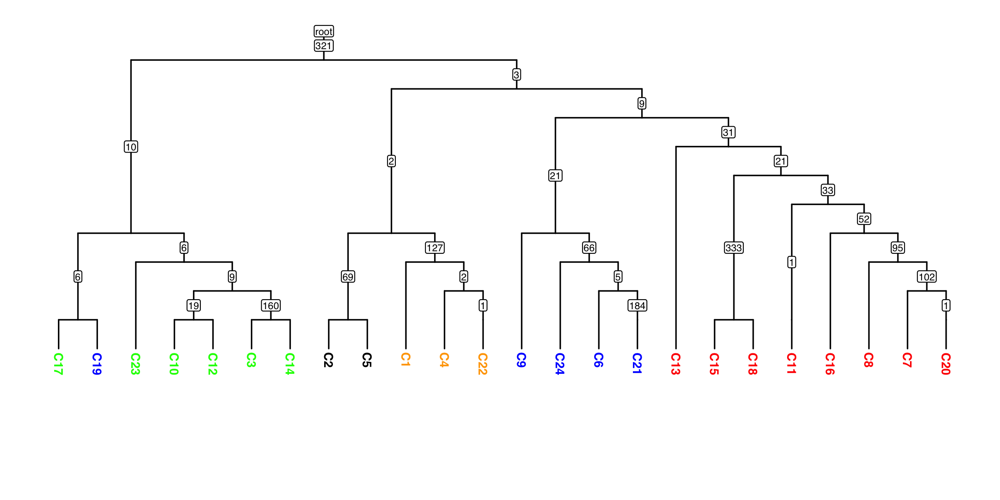

-----------------------------------------------------------------------------------

False positive rate = 1e-05
False negative rate = 0.1


Negative Log Likehood of the Inferred Tree: 3098.969906717329


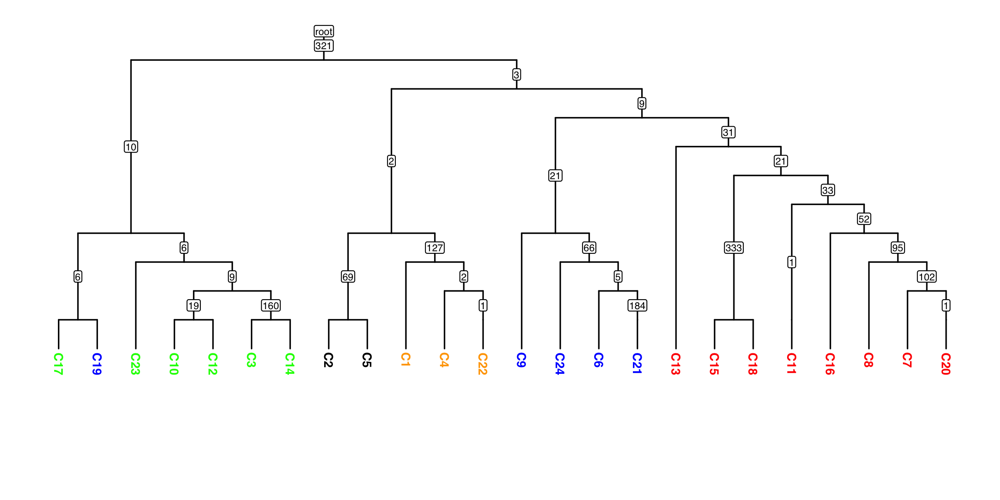

-----------------------------------------------------------------------------------

False positive rate = 1e-05
False negative rate = 0.125


Negative Log Likehood of the Inferred Tree: 3211.5476949876447


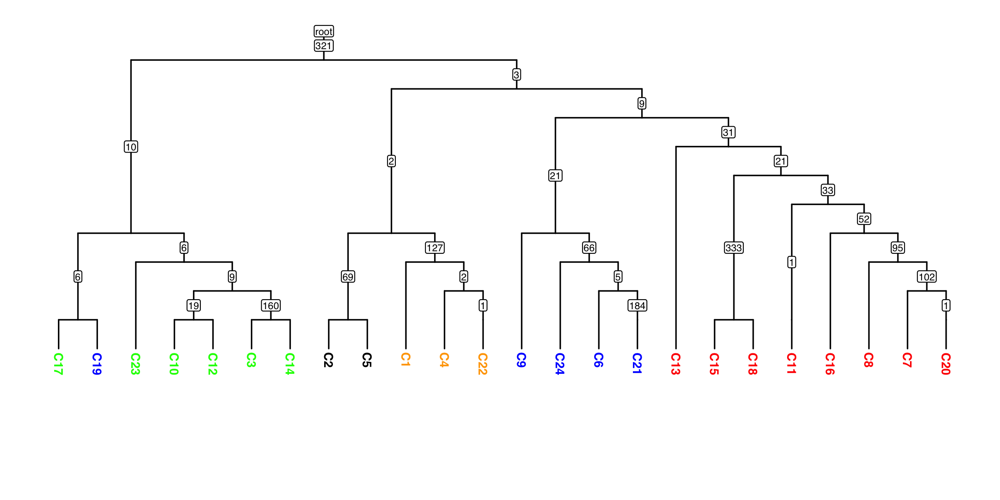

-----------------------------------------------------------------------------------

False positive rate = 1e-05
False negative rate = 0.15


Negative Log Likehood of the Inferred Tree: 3365.88378286097


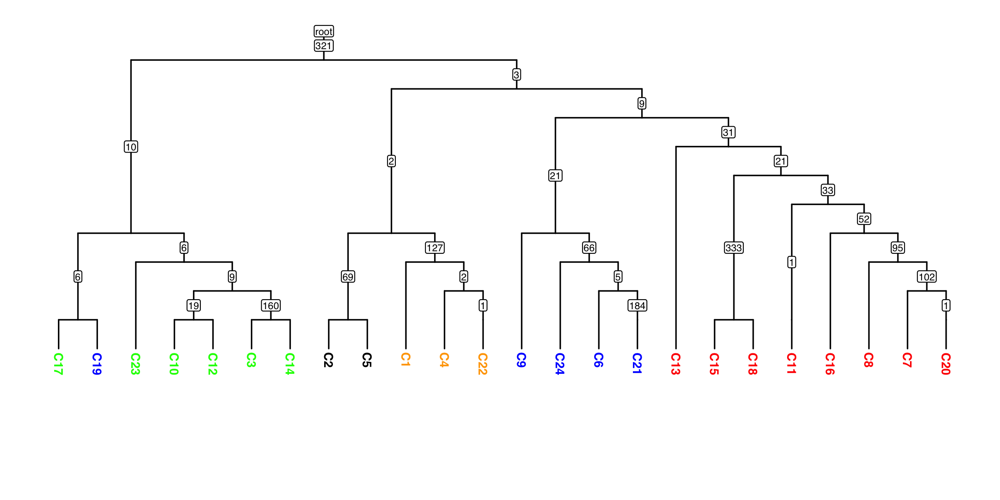

-----------------------------------------------------------------------------------

False positive rate = 1e-05
False negative rate = 0.175


Negative Log Likehood of the Inferred Tree: 3552.18947661648


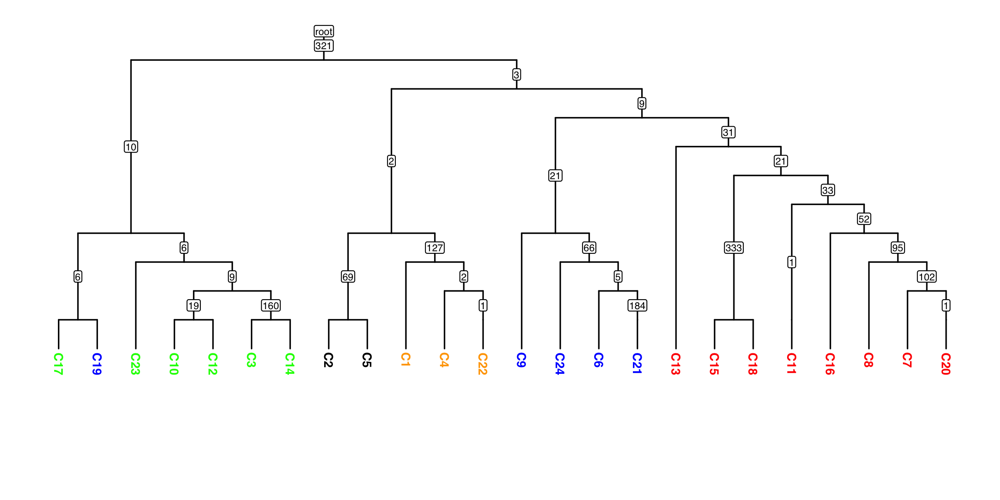

-----------------------------------------------------------------------------------

False positive rate = 1e-05
False negative rate = 0.2


Negative Log Likehood of the Inferred Tree: 3764.8741261357027


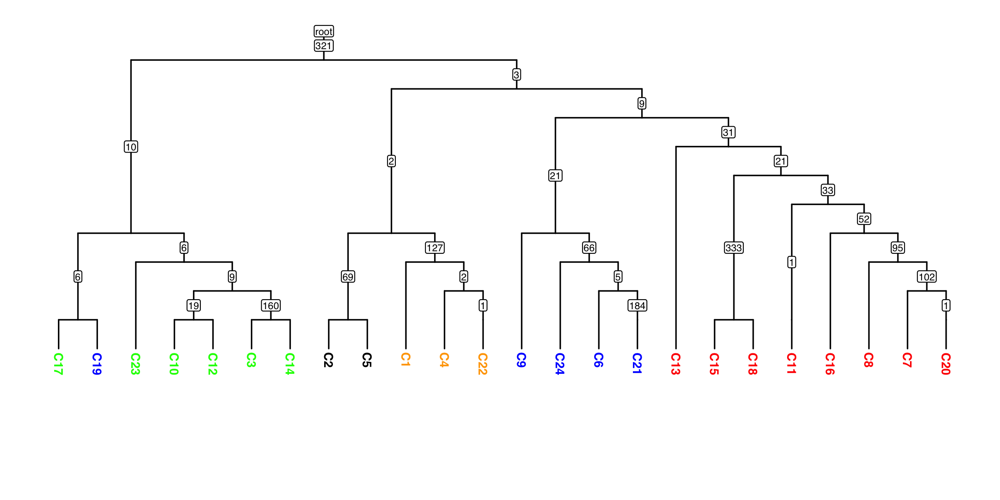

-----------------------------------------------------------------------------------

False positive rate = 1e-06
False negative rate = 0.05


Negative Log Likehood of the Inferred Tree: 3116.6713160390277


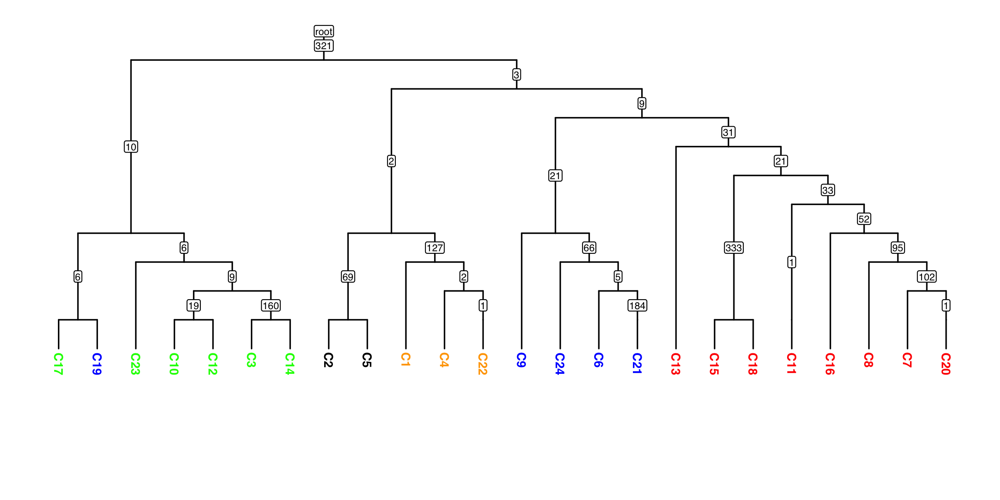

-----------------------------------------------------------------------------------

False positive rate = 1e-06
False negative rate = 0.075


Negative Log Likehood of the Inferred Tree: 3065.1458905659943


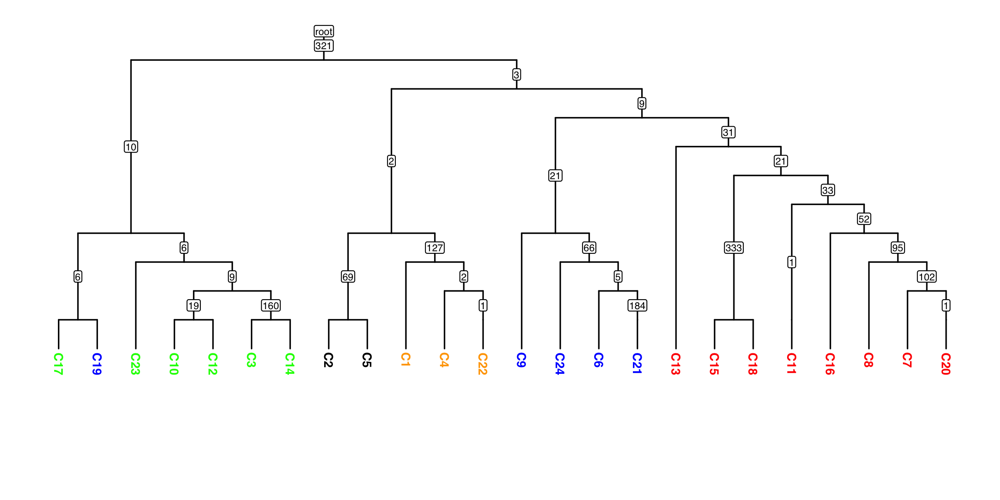

-----------------------------------------------------------------------------------

False positive rate = 1e-06
False negative rate = 0.1


Negative Log Likehood of the Inferred Tree: 3117.127570011125


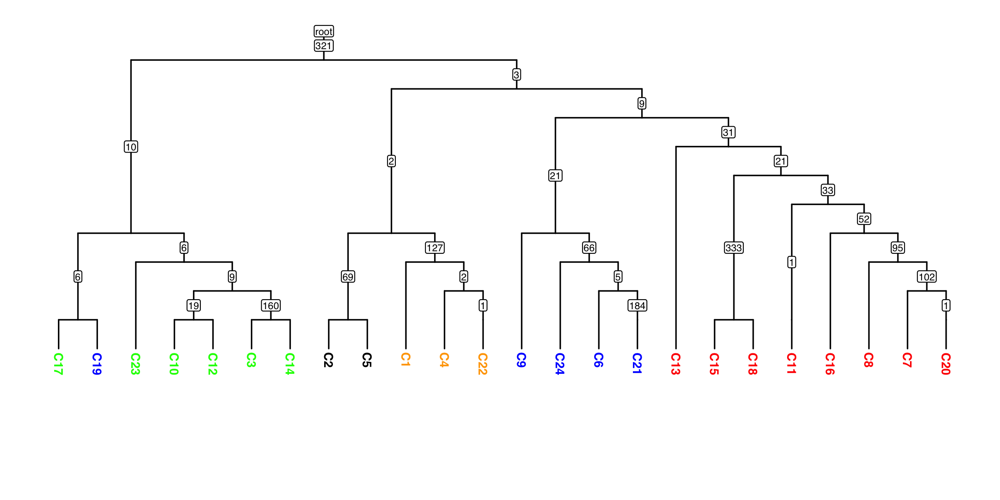

-----------------------------------------------------------------------------------

False positive rate = 1e-06
False negative rate = 0.125


Negative Log Likehood of the Inferred Tree: 3229.7053582814615


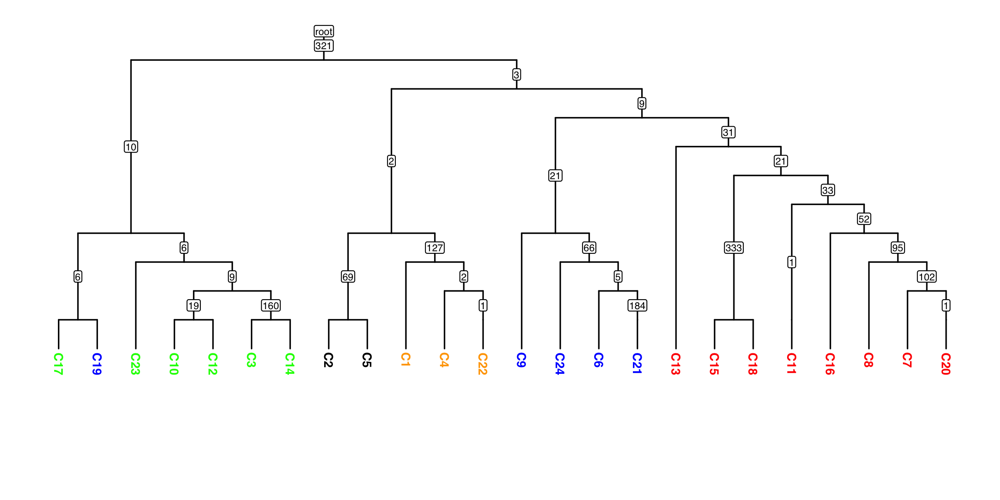

-----------------------------------------------------------------------------------

False positive rate = 1e-06
False negative rate = 0.15


Negative Log Likehood of the Inferred Tree: 3384.0414461546184


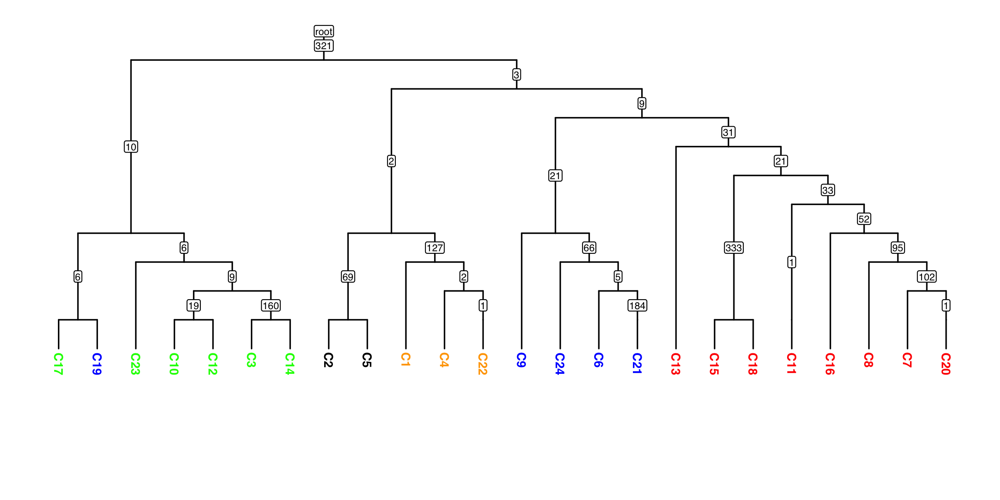

-----------------------------------------------------------------------------------

False positive rate = 1e-06
False negative rate = 0.175


Negative Log Likehood of the Inferred Tree: 3570.347139909795


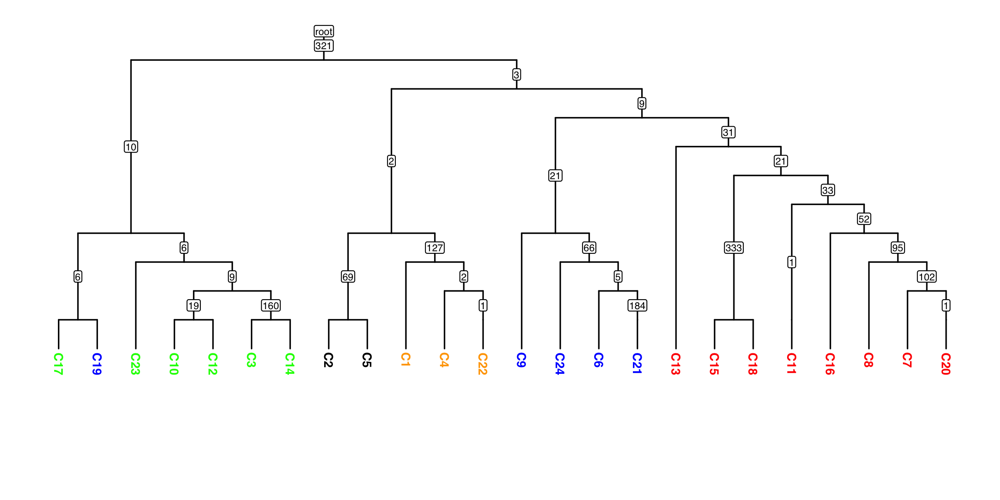

-----------------------------------------------------------------------------------

False positive rate = 1e-06
False negative rate = 0.2


Negative Log Likehood of the Inferred Tree: 3783.9243546338757


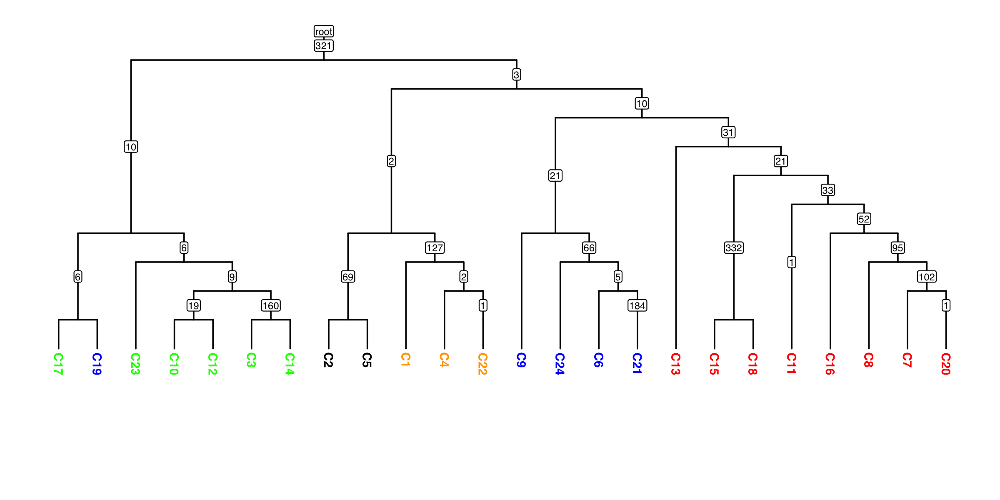

-----------------------------------------------------------------------------------

Tree inference has been completed successfully. For the best tree, check the folder ./output/after_input_correction/fp_0.0001-fn_0.075



In [7]:
# Correct for the doublet and potential LOH events in C2 and C5, then rebuild the tree

bestE = read_matrix(os.path.join(uncorrected_data_output_folder, "fp_0.001-fn_0.075", "E-fp_0.001-fn_0.075.tsv"), entries_type="int")
D     = read_matrix(os.path.join(uncorrected_data_output_folder, "fp_0.001-fn_0.075", "D.tsv"), entries_type="int")


# set to 0 in C19 all non-clonal mutations that do not have 3 variant-supporting reads in the resequencing experiment
for mut_id in get_column_ids(D):
    if np.sum([bestE[cell_id][mut_id] for cell_id in get_row_ids(bestE)]) == 24:
        continue

    if read_counts["C19-resequenced"][mut_id]["variant"] <= 3 and bestE["C21"][mut_id] == 1:
        D["C19"][mut_id] = 0


# declare as missing entries (i.e., set to 3) the 23 mutations rooting the clade containing all sublines except C2 and C5
absent_in_C2_C5_muts = get_mutations_specific_to_clade(bestE, ["C" + str(i) for i in range(1, 25) if i not in [2,5]])
for mut_id in absent_in_C2_C5_muts:
    for cell_id in ["C2", "C5"]:
        D[cell_id][mut_id] = 3
        

corrected_data_output_folder = os.path.join(parent_output_folder, "after_input_correction")
E = infer_tree(D, corrected_data_output_folder)


The plot below shows the optimal tree based on the original sequencing dataset (i.e., before any corrections).


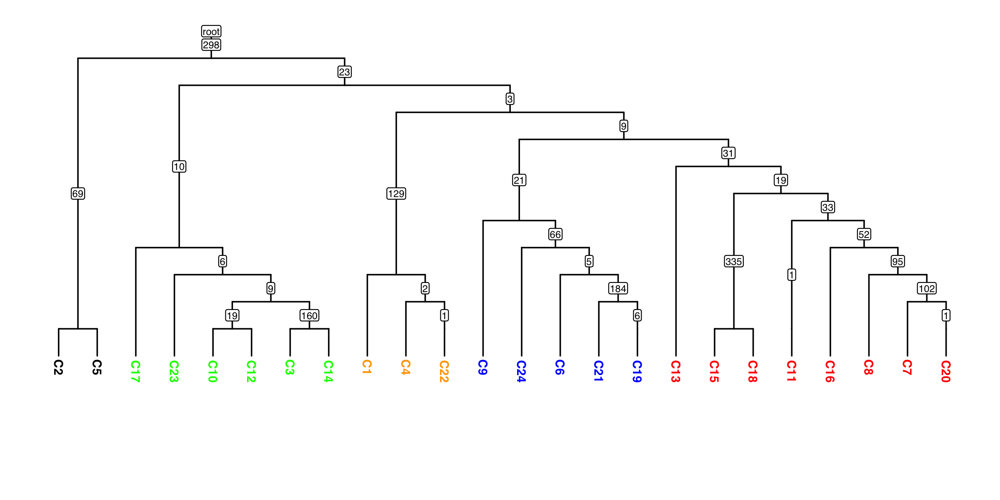

In [8]:
# Plotting optimal tree before corrections (uncorrected tree)
E = read_matrix(os.path.join(uncorrected_data_output_folder, "fp_0.001-fn_0.075", "E-fp_0.001-fn_0.075.tsv"), entries_type="int")
D = read_matrix(os.path.join(uncorrected_data_output_folder, "fp_0.001-fn_0.075", "D.tsv"), entries_type="int")

print("\nThe plot below shows the optimal tree based on the original sequencing dataset (i.e., before any corrections).")
conflict_free_matrix =  pd.DataFrame(E).transpose()
tree = tsc.ul.to_tree(conflict_free_matrix)
tsc.pl.dendro_tree(tree, cell_info = sublines_info, label_color = 'subline_color', 
                               width = 2400, height = 1200, dpi = 300
                  )


The plot below shows the optimal tree after correcting for a doublet in C19 and potential LOH events in C2 and C5.


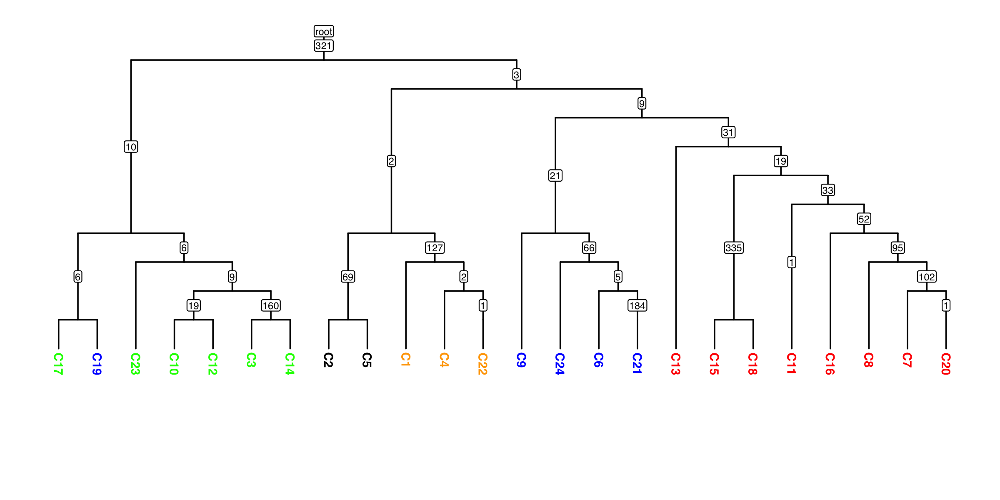

In [9]:
# Plotting optimal tree after corrections (corrected tree)
E = read_matrix(os.path.join(corrected_data_output_folder, "fp_0.0001-fn_0.075", "E-fp_0.0001-fn_0.075.tsv"), entries_type="int")
D = read_matrix(os.path.join(corrected_data_output_folder, "fp_0.0001-fn_0.075", "D.tsv"), entries_type="int")

print("\nThe plot below shows the optimal tree after correcting for a doublet in C19 and potential LOH events in C2 and C5.")
conflict_free_matrix =  pd.DataFrame(E).transpose()
tree = tsc.ul.to_tree(conflict_free_matrix)
tsc.pl.dendro_tree(tree, cell_info = sublines_info, label_color = 'subline_color', 
                               width = 2400, height = 1200, dpi = 300
                  )


The plot below displays the VAF distribution of variants identified in C19 using the original sequencing dataset.
This subline is an outlier compared to the others in terms of both median and average VAFs of detected mutations.

The median VAF of all mutation calls in subline C19 is:                       0.24
The median VAF of all mutation calls across all sublines, excluding C19, is:  0.44

The average VAF of all mutation calls in subline C19 is                       0.30
The average VAF of all mutation calls across all sublines, excluding C19, is: 0.42




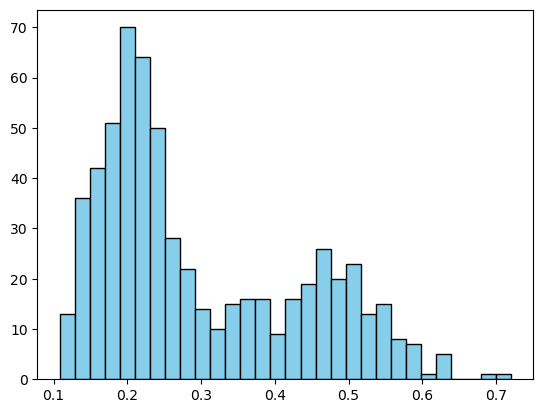

In [10]:
E = read_matrix(os.path.join(uncorrected_data_output_folder, "fp_0.001-fn_0.075", "E-fp_0.001-fn_0.075.tsv"), entries_type="int")
D = read_matrix(os.path.join(uncorrected_data_output_folder, "fp_0.001-fn_0.075", "D.tsv"), entries_type="int")

all_vafs_other_than_C19 = []
vaf_array = {}

for cell_id in all_sublines_sorted:
    vaf_array[cell_id] = []
    for mut_id in get_column_ids(D):
        if D[cell_id][mut_id] == 1:
            VAF = (1.0*read_counts[cell_id][mut_id]["variant"])/(read_counts[cell_id][mut_id]["variant"] + read_counts[cell_id][mut_id]["ref"])
            vaf_array[cell_id].append(VAF)
            if cell_id != "C19":
                all_vafs_other_than_C19.append(VAF)
            
    
print("\nThe plot below displays the VAF distribution of variants identified in C19 using the original sequencing dataset.")
print("This subline is an outlier compared to the others in terms of both median and average VAFs of detected mutations.\n")
print("The median VAF of all mutation calls in subline C19 is:                       " +  float_to_string(np.median(vaf_array["C19"])))
print("The median VAF of all mutation calls across all sublines, excluding C19, is:  " + float_to_string(np.median(all_vafs_other_than_C19)))
print("\nThe average VAF of all mutation calls in subline C19 is                       " +  float_to_string(np.average(vaf_array["C19"])))
print("The average VAF of all mutation calls across all sublines, excluding C19, is: " + float_to_string(np.average(all_vafs_other_than_C19)))
print("\n")
plt.figure()
plt.hist(vaf_array["C19"], bins=30, color='skyblue', edgecolor='black')
plt.show()


The total number of mutations reported as present in C19 and C21, but absent in C17, in the original sequencing is 288.
Average VAFs of these mutations in the sublines of interest are shown below.
C19 and C21 correspond to the original (first) sequencing of these sublines.

Average VAF in C17: 0.0004928074114402975
Average VAF in C19: 0.20543299126768452
Average VAF in C21: 0.46879935763534153
Average VAF in C19-resequenced: 0.002828223881846431
Average VAF in C21-resequenced: 0.4546100778616701




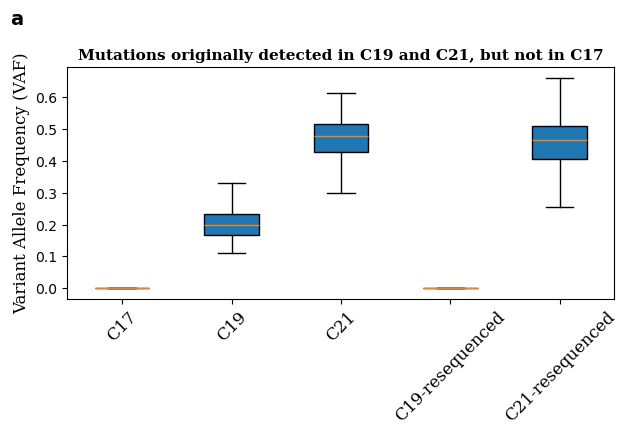

In [11]:
muts_of_interest = []
for mut_id in get_column_ids(D):
    if ((D["C17"][mut_id] == 0) and (D["C19"][mut_id] == 1) and (D["C21"][mut_id] == 1)):
        muts_of_interest.append(mut_id)

print("\nThe total number of mutations reported as present in C19 and C21, but absent in C17, in the original sequencing is " + str(len(muts_of_interest)) + ".")
print("Average VAFs of these mutations in the sublines of interest are shown below.\nC19 and C21 correspond to the original (first) sequencing of these sublines.\n")

vaf_array = {}

cell_ids = ["C17", "C19", "C21", "C19-resequenced", "C21-resequenced"]

for cell_id in cell_ids:
    vaf_array[cell_id] = []
    
    for mut_id in muts_of_interest:
        variant = read_counts[cell_id][mut_id]["variant"]
        ref = read_counts[cell_id][mut_id]["ref"]
        VAF = (1.0*variant)/(variant + ref)
        
        vaf_array[cell_id].append(VAF)
        
for cell_id in cell_ids:
    print("Average VAF in " + cell_id + ": " + str(np.average(vaf_array[cell_id])))

print("\n")

data = [vaf_array[cell_id] for cell_id in cell_ids]
plt.boxplot(data, showfliers=False, patch_artist=True)
    
    
   
clade = ["C17", "C19", "C21"]
font = {'family': 'serif', 'size': 12}


# Add labels
plt.xticks([i+1 for i in range(len(cell_ids))], clade + ["C19-resequenced", "C21-resequenced"], rotation=45, fontdict=font)
clade_in_title = "C21, C19"
plt.title("Mutations originally detected in C19 and C21, but not in C17", fontdict={'family': 'serif', 'size': 11, 'weight': 'bold'})
plt.ylabel('Variant Allele Frequency (VAF)', fontdict=font)

plt.text(-0.105, 1.25, 'a', transform=plt.gca().transAxes, fontsize=14, fontweight='bold', va='top', ha='left')

    # Show the plot
plt.tight_layout()
plt.savefig(os.path.join(parent_output_folder, "C19-C21_present-C17_absent.pdf"), dpi=600, bbox_inches='tight')
plt.show()  


The total number of mutations reported as present in C17 and C19, but absent in C21, in the original sequencing is 23.
Average VAFs of these mutations in the sublines of interest are shown below.
C19 and C21 correspond to the original (first) sequencing of these sublines.

Average VAF in C17: 0.4680072625856307
Average VAF in C19: 0.2711376690335859
Average VAF in C21: 0.005223815489681189
Average VAF in C19-resequenced: 0.44263369881648307
Average VAF in C21-resequenced: 0.0



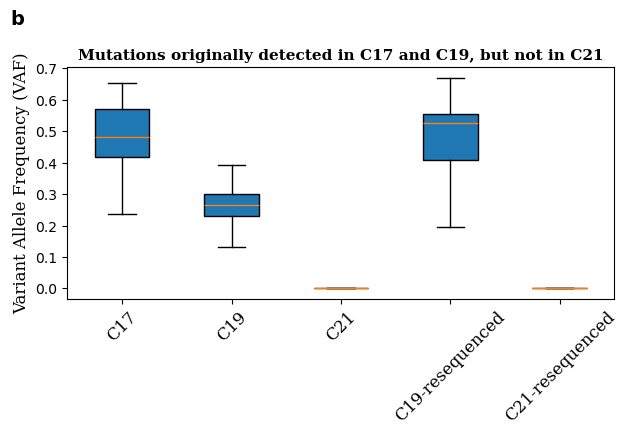

In [12]:
muts_of_interest = []
for mut_id in get_column_ids(D):
    if ((D["C17"][mut_id] == 1) and (D["C19"][mut_id] == 1) and (D["C21"][mut_id] == 0)):
        muts_of_interest.append(mut_id)
        
print("\nThe total number of mutations reported as present in C17 and C19, but absent in C21, in the original sequencing is " + str(len(muts_of_interest)) + ".")
print("Average VAFs of these mutations in the sublines of interest are shown below.\nC19 and C21 correspond to the original (first) sequencing of these sublines.\n")

vaf_array = {}
    
for cell_id in cell_ids:
    vaf_array[cell_id] = []
    
    for mut_id in muts_of_interest:
        variant = read_counts[cell_id][mut_id]["variant"]
        ref = read_counts[cell_id][mut_id]["ref"]
        VAF = (1.0*variant)/(variant + ref)
        
        vaf_array[cell_id].append(VAF)
        
for cell_id in cell_ids:
    print("Average VAF in " + cell_id + ": " + str(np.average(vaf_array[cell_id])))
print("")

data = [vaf_array[cell_id] for cell_id in cell_ids]
plt.boxplot(data, showfliers=False, patch_artist=True)
    
    
   
clade = ["C17", "C19", "C21"]
font = {'family': 'serif', 'size': 12}
# Add labels
plt.xticks([i+1 for i in range(len(cell_ids))], clade + ["C19-resequenced", "C21-resequenced"], rotation=45, fontdict=font)

plt.title("Mutations originally detected in C17 and C19, but not in C21", fontdict={'family': 'serif', 'size': 11, 'weight': 'bold'})
plt.ylabel('Variant Allele Frequency (VAF)', fontdict=font)

plt.text(-0.105, 1.25, 'b', transform=plt.gca().transAxes, fontsize=14, fontweight='bold', va='top', ha='left')

    # Show the plot
plt.tight_layout()
plt.savefig(os.path.join(parent_output_folder, "C17-C19_present-C21_absent.pdf"), dpi=600, bbox_inches='tight')
plt.show()
    

In [13]:
# Printing (sorted) locations of mutations reported to be present in all sublines except C2,C5 (in the uncorrected tree)

clade = ["C" + str(i) for i in range(1,25) if i not in [2,5]]

muts_absent_in_C2C5 = get_mutations_specific_to_clade(E, clade)
muts_absent_in_C2C5.sort(key=functools.cmp_to_key(compare_positions))

print("Below is a list of the 23 mutations placed at the root of the clade containing all sublines except C2 and C5.")
print("As can be seen from this list, all 23 mutations are located on only three chromosomes.")
print("This suggests the potential presence of LOH events occurring at the root of the clade containing C2 and C5.\n")

print("\n".join(muts_absent_in_C2C5))

Below is a list of the 23 mutations placed at the root of the clade containing all sublines except C2 and C5.
As can be seen from this list, all 23 mutations are located on only three chromosomes.
This suggests the potential presence of LOH events occurring at the root of the clade containing C2 and C5.

3-60037216-T-A
3-70018598-T-G
3-79604987-A-G
3-79623503-T-C
3-86360283-A-C
3-92320916-G-C
3-92620349-C-T
3-95562653-G-A
3-107326356-A-C
3-115978866-A-G
3-132842741-G-A
3-134967080-T-G
3-135411188-T-A
15-6768114-G-C
15-8651084-A-T
15-73753656-G-T
15-76074752-C-T
15-76185790-G-T
15-89161646-G-C
15-101892250-G-C
15-102490853-T-C
16-87397063-A-G
16-97797642-T-C
